In [1]:
import pandas
from pandas.tools.plotting import scatter_matrix
import matplotlib.pyplot as plt
from sklearn import cross_validation
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
import numpy as np
import glob
from sklearn.externals import joblib
%matplotlib inline

//anaconda/lib/python3.5/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [2]:
Iax_dir = "/Users/tktakaro/Documents/Type-Iax-HST" #"D:/Research/Type-Iax-HST"
catalog = np.loadtxt(Iax_dir + "/images/sn2010el/sn2010el.phot")

In [3]:
pos_predict = np.zeros((catalog.shape[0],2))
info_predict = np.zeros(np.shape(catalog))

j = 0 # Iteration variable for positions array
for i in range(catalog.shape[0]): # Cycles through each object in catalog
    # Checks to make sure point is "good"
    # Good defined by: 1. S/N > 3.5     2. Sharpness < .25     3. Roundness < 1     4. Crowding < .1 
    #                  5. Object type = "Bright Star"
    if ((catalog[i][5] >= 3.5)&(abs(catalog[i][6]) < .25)&(abs(catalog[i][7]) < 1)
        &(catalog[i][9] < .1)&(catalog[i][10] == 1)):
        pos_predict[j][0] = catalog[i][2] # Assigns X position
        pos_predict[j][1] = catalog[i][3] # Assigns Y position
        info_predict[j] = catalog[i]
        j = j + 1
                
# Trims all zeros from end of positions array, left from "bad" objects
pos_predict = pos_predict[~np.all(pos_predict == 0, axis=1)]
info_predict = info_predict[~np.all(info_predict == 0, axis=1)]

# Saves high S/N object X,Y positions
np.savetxt("Region_files/sn2010el_FirstPrediction.reg", pos_predict, '%5.2f')

# Load in stars in ROI identified by eye as good and create CMDs

In [4]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2010el_200pc.reg", "r+")

def mysplit(s, delim=None):
    return [x for x in s.split(delim) if x]

text = asci.readlines()
region = np.zeros([280,2])
for i in range(280):
    A = mysplit(text[i+3], ' # ')
    if A[1][-2] == 'w':
        region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
        region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
region = region[~np.all(region == 0, axis=1)]

# Info for each star chosen as real 
infoF3 = np.zeros([region.shape[0],info_predict.shape[1]])

j = 0 # Iteration variable for region array
for i in range(info_predict.shape[0]): # Cycles through each star predicted above
    if (pos_predict[i][0] > 2260)&(pos_predict[i][0] < 2569)&(pos_predict[i][1] > 1417)&(pos_predict[i][1] < 1726):
        if (region[j][0] == pos_predict[i][0])&(region[j][1] == pos_predict[i][1]):
            infoF3[j] = info_predict[i]
            j = j + 1
            if j == region.shape[0]: break

In [5]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2010el_133pc.reg", "r+")

text = asci.readlines()
region = np.zeros([122,2])
for i in range(122):
    A = mysplit(text[i+3], ' # ')
    if A[1][-2] == 'w':
        region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
        region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
region = region[~np.all(region == 0, axis=1)]

infoF2 = np.zeros([region.shape[0], info_predict.shape[1]])

j = 0 # Iteration variable for region array
for i in range(infoF3.shape[0]): # Cycles through each star predicted above
    if (infoF3[i][2] > 2260)&(infoF3[i][2] < 2569)&(infoF3[i][3] > 1417)&(infoF3[i][1] < 1726):
        if (region[j][0] == infoF3[i][2])&(region[j][1] == infoF3[i][3]):
            infoF2[j] = infoF3[i]
            j = j + 1
            if j == region.shape[0]: break

In [6]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2010el_67pc.reg", "r+")

text = asci.readlines()
region = np.zeros([31,2])
for i in range(31):
    A = mysplit(text[i+3], ' # ')
    if A[1][-2] == 'w':
        region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
        region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
region = region[~np.all(region == 0, axis=1)]

infoF1 = np.zeros([region.shape[0], info_predict.shape[1]])

j = 0 # Iteration variable for region array
for i in range(infoF2.shape[0]): # Cycles through each star predicted above
    if (infoF2[i][2] > 2260)&(infoF2[i][2] < 2569)&(infoF2[i][3] > 1417)&(infoF2[i][1] < 1726):
        if (region[j][0] == infoF2[i][2])&(region[j][1] == infoF2[i][3]):
            infoF1[j] = infoF2[i]
            j = j + 1
            if j == region.shape[0]: break

[-0.6, 4.1, 29, 22]

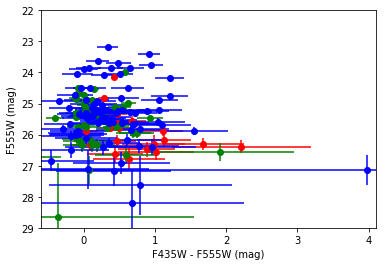

In [7]:
for i in range(infoF3.shape[0]):
    for j in range(infoF2.shape[0]):
        if np.array_equal(infoF3[i],infoF2[j]):
            infoF3[i] = np.zeros(infoF3[i].size)
for i in range(infoF2.shape[0]):
    for j in range(infoF1.shape[0]):
        if np.array_equal(infoF2[i],infoF1[j]):
            infoF2[i] = np.zeros(infoF2[i].size)

infoF2 = infoF2[~np.all(infoF2 == 0, axis=1)]
infoF3 = infoF3[~np.all(infoF3 == 0, axis=1)]
# F555W vs F435W - F555W
F435W_F1 = infoF1[:,15]
xerr_F1 = np.sqrt(infoF1[:,17]**2 + infoF1[:,30]**2)
F555W_F1 = infoF1[:,28]
yerr_F1 = infoF1[:,30]

F435W_F2 = infoF2[:,15]
xerr_F2 = np.sqrt(infoF2[:,17]**2 + infoF2[:,30]**2)
F555W_F2 = infoF2[:,28]
yerr_F2 = infoF2[:,30]

F435W_F3 = infoF3[:,15]
xerr_F3 = np.sqrt(infoF3[:,17]**2 + infoF3[:,30])
F555W_F3 = infoF3[:,28]
yerr_F3 = infoF3[:,30]

line1 = plt.errorbar(F435W_F1 - F555W_F1, F555W_F1, fmt='ro', xerr=xerr_F1, yerr=yerr_F1)
line2 = plt.errorbar(F435W_F2 - F555W_F2, F555W_F2, fmt='go', xerr=xerr_F2, yerr=yerr_F2)
line3 = plt.errorbar(F435W_F3 - F555W_F3, F555W_F3, fmt='bo', xerr=xerr_F3, yerr=yerr_F3)

#plt.plot(F435W_F1 - F555W_F1, F555W_F1, 'ro', F435W_F2 - F555W_F2, F555W_F2, 'go', F435W_F3 - F555W_F3, F555W_F3, 'bo')
plt.gca().invert_yaxis()
plt.xlabel('F435W - F555W (mag)')
plt.ylabel('F555W (mag)')
plt.axis([-.6,4.1,29,22])

[-1, 3, 27, 22]

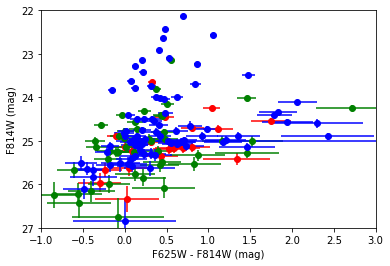

In [8]:
F625W_F1 = infoF1[:,41]
xerr2_F1 = np.sqrt(infoF1[:,43]**2 + infoF1[:,56]**2)
F814W_F1 = infoF1[:,54]
yerr2_F1 = infoF1[:,56]

F625W_F2 = infoF2[:,41]
xerr2_F2 = np.sqrt(infoF2[:,43]**2 + infoF2[:,56]**2)
F814W_F2 = infoF2[:,54]
yerr2_F2 = infoF2[:,56]

F625W_F3 = infoF3[:,41]
xerr2_F3 = np.sqrt(infoF3[:,43]**2 + infoF3[:,56]**2)
F814W_F3 = infoF3[:,54]
yerr2_F3 = infoF3[:,56]

line1 = plt.errorbar(F625W_F1 - F814W_F1, F814W_F1, fmt='ro', xerr=xerr2_F1, yerr=yerr2_F1)
line2 = plt.errorbar(F625W_F2 - F814W_F2, F814W_F2, fmt='go', xerr=xerr2_F2, yerr=yerr2_F2)
line3 = plt.errorbar(F625W_F3 - F814W_F3, F814W_F3, fmt='bo', xerr=xerr2_F3, yerr=yerr2_F3)

#plt.plot(F625W_F1 - F814W_F1, F814W_F1, 'ro', F625W_F2 - F814W_F2, F814W_F2, 'go', F625W_F3 - F814W_F3, F814W_F3, 'bo')
plt.gca().invert_yaxis()
plt.xlabel('F625W - F814W (mag)')
plt.ylabel('F814W (mag)')
plt.axis([-1,3,27,22])

In [9]:
import os
import glob
import matplotlib as mpl

mist_dir = Iax_dir + "/MIST_v1.0_HST_ACSWF"
# All of this MIST isochrone code comes from Asher

In [10]:
kwargs = {"names": ["EEP", "log10_isochrone_age_yr", "initial_mass", "log_Teff", "log_g",
                    "log_L", "z_surf", "ACS_WFC_F435W", "ACS_WFC_F475W", "ACS_WFC_F502N",
                    "ACS_WFC_F550M", "ACS_WFC_F555W", "ACS_WFC_F606W", "ACS_WFC_F625W", 
                    "ACS_WFC_F658N", "ACS_WFC_F660N", "ACS_WFC_F775W", "ACS_WFC_F814W",
                    "ACS_WFC_F850LP", "ACS_WFC_F892N", "phase"],
         "delim_whitespace": True, "comment": "#"}
isochrones = {}
for filename in glob.glob(mist_dir + "/*.iso.cmd"):
    feh_string = filename.split("/")[-1].split("_")[3] # Pulls metalicity information
    if feh_string[0] == "p":
        feh = float(feh_string[1:]) # feh is [Fe/H]
    elif feh_string[0] == "m":
        feh = -float(feh_string[1:])
    else:
        raise ValueError
    df = pandas.read_csv(filename, **kwargs)
    df['ages'] = 10 ** df.log10_isochrone_age_yr / 1e9
    isochrones[feh] = df # Creates dictionary accessible by entering a particular metalicity

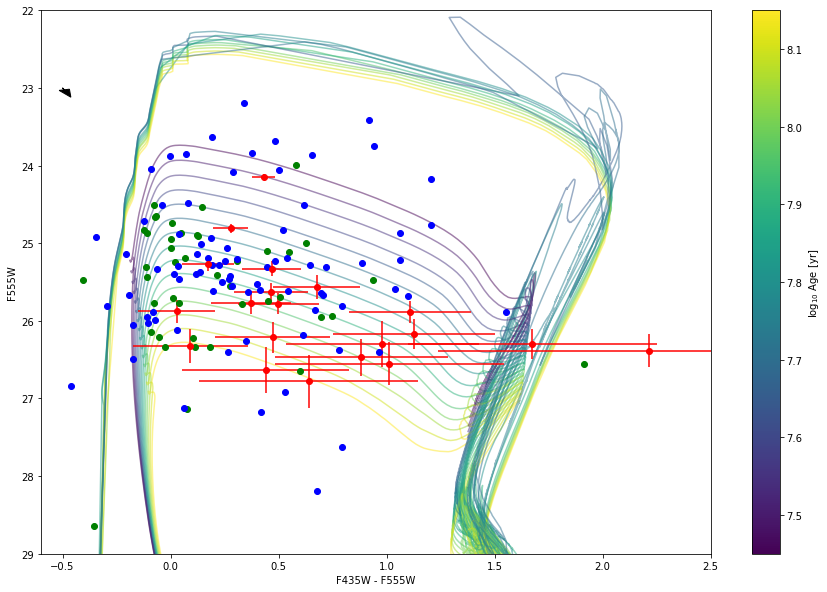

In [11]:
# fix metallicity, vary age
df = isochrones[0.50]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 7.4) & (ages < 8.2)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(5.63e6) - 1)
    F435W_ext = 0.033 # extinction in F435W in NGC 1566 from NED
    F555W_ext = 0.025 # extinction in F555W in NGC 1566 from NED
    Gal_ext = 0
    # Multiply Gal_ext by A_lambda/E(B-V) values from Schlafly, Finkbeiner 2011
    mag = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
    color = df[idx].ACS_WFC_F435W - df[idx].ACS_WFC_F555W  + F435W_ext - F555W_ext + (3.610 - 2.792) * Gal_ext
    age_cmd[age] = (color, mag)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
# Plots stars
line1 = plt.errorbar(F435W_F1 - F555W_F1, F555W_F1, fmt='ro', xerr=xerr_F1, yerr=yerr_F1)
#line2 = plt.errorbar(F435W_F2 - F555W_F2, F555W_F2, fmt='go', xerr=xerr_F2, yerr=yerr_F2)
line2 = plt.plot(F435W_F2 - F555W_F2, F555W_F2, 'go')
#line3 = plt.errorbar(F435W_F3 - F555W_F3, F555W_F3, fmt='bo', xerr=xerr_F3, yerr=yerr_F3)
line3 = plt.plot(F435W_F3 - F555W_F3, F555W_F3, 'bo')
#plt.plot(F435W_F1 - F555W_F1, F555W_F1, 'ro', F435W_F2 - F555W_F2, F555W_F2, 'go', F435W_F3 - F555W_F3, F555W_F3, 'bo')
# Plots reddening vector
plt.arrow(-0.5, 23, F435W_ext - F555W_ext + (3.610 - 2.792)*Gal_ext, F555W_ext + 2.792*Gal_ext,
          head_width=0.05, head_length=0.1, fc='k', ec='k')

plt.xlabel("F435W - F555W")
plt.ylabel("F555W")
plt.ylim(29,22)
plt.xlim(-.6, 2.5)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')
plt.draw()
plt.show()

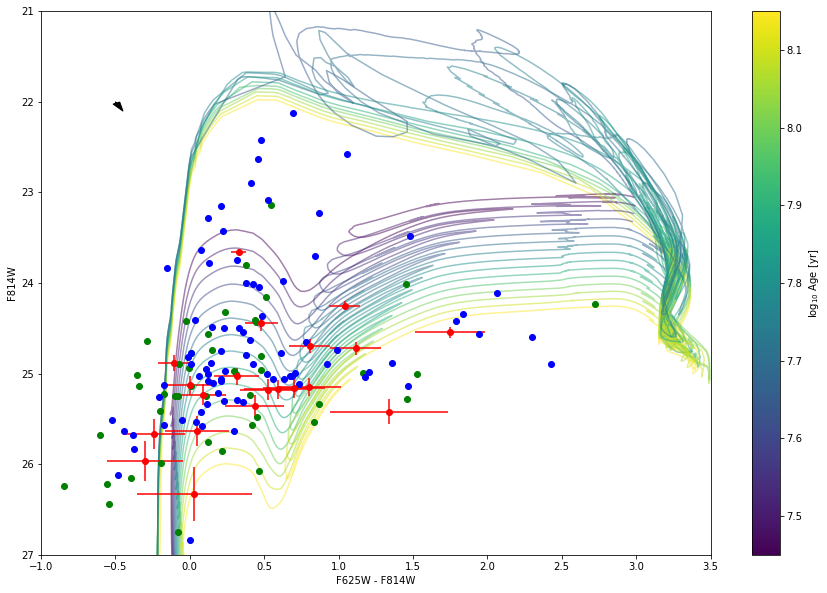

In [12]:
# fix metallicity, vary age
df = isochrones[0.50]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}


ages = ages[(ages > 7.4) & (ages < 8.2)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Two adjustments: 1. Distance: added to mag 2. Extinction: added to both.
    F625W_ext = .021 # extinction in F625W in NGC 1566 from NED
    F814W_ext = .014 # extinction in F814W in NGC 1566 from NED
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    color = df[idx].ACS_WFC_F625W - df[idx].ACS_WFC_F814W + F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
# Plots stars
line1 = plt.errorbar(F625W_F1 - F814W_F1, F814W_F1, fmt='ro', xerr=xerr2_F1, yerr=yerr2_F1)
#line2 = plt.errorbar(F625W_F2 - F814W_F2, F814W_F2, fmt='go', xerr=xerr2_F2, yerr=yerr2_F2)
line2 = plt.plot(F625W_F2 - F814W_F2, F814W_F2, 'go')
#line3 = plt.errorbar(F625W_F3 - F814W_F3, F814W_F3, fmt='bo', xerr=xerr2_F3, yerr=yerr2_F3)
line3 = plt.plot(F625W_F3 - F814W_F3, F814W_F3, 'bo')
#plt.plot(F625W_F1 - F814W_F1, F814W_F1, 'ro', F625W_F2 - F814W_F2, F814W_F2, 'go', F625W_F3 - F814W_F3, F814W_F3, 'bo')
# Plots reddening vector
plt.arrow(-0.5, 22, F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext, F814W_ext + 1.526*Gal_ext,
          head_width=0.05, head_length=0.1, fc='k', ec='k')

plt.xlabel("F625W - F814W")
plt.ylabel("F814W")
plt.ylim(27,21)
plt.xlim(-1, 3.5)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')

# Attempt to remove clusters by identifying "concentration index"

In [13]:
# Using IRAF to compute actual concentration index, i.e. photometry at .5 pixels to photometry at 3 pixels
ascii_1 = open(Iax_dir + "/images/sn2010el/sn2010el_acs_f625w_lacosmic.fits.mag.4")
ascii_2 = open(Iax_dir + "/images/sn2010el/sn2010el_acs_f625w_lacosmic.fits.mag.5")
text_1 = ascii_1.readlines()
text_2 = ascii_2.readlines()

concentration = np.zeros(280)
for i in range(280):
    if mysplit(text_1[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at .5 pixels
        concentration[i] = 99
    elif mysplit(text_2[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at 3 pixels
        concentration[i] = -99
    else: concentration[i] = float(mysplit(text_1[5*i + 79])[4]) - float(mysplit(text_2[5*i + 79])[4])
ascii_1.close()
ascii_2.close()

In [14]:
asci = open(Iax_dir + "/machine_learning/New_Start(2017)/sn2010el_200pc.reg", "r+")
text = asci.readlines()

region = np.zeros([280,2])
for i in range(280):
    A = mysplit(text[i+3], ' # ')
    region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
    region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]

# Info for each star chosen as real 
info = np.zeros([region.shape[0],info_predict.shape[1]])

j = 0 # Iteration variable for region array
for i in range(info_predict.shape[0]): # Cycles through each star predicted above
    if (pos_predict[i][0] > 2260)&(pos_predict[i][0] < 2569)&(pos_predict[i][1] > 1417)&(pos_predict[i][1] < 1726):
        if (region[j][0] == pos_predict[i][0])&(region[j][1] == pos_predict[i][1]):
            info[j] = info_predict[i]
            j = j + 1
            if j == region.shape[0]: break

(28, 21)

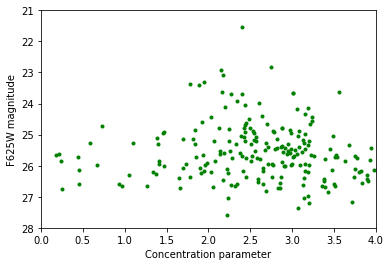

In [15]:
# Plots the concentration parameter vs magnitude
plt.plot(concentration, info[:,41], 'g.')
plt.xlabel('Concentration parameter')
plt.ylabel('F625W magnitude')
plt.xlim(0,4)
plt.ylim(28,21)

In [16]:
# Cut out clusters (identified as objects with concentration parameter < 2.3, from Chandar et. al. 2010)
new_info = np.zeros(info.shape)
for i in range(280):
    if (concentration[i] < 2.3): # & (concentration[i] >= 0):
        new_info[i] = info[i]
new_info = new_info[~np.all(new_info == 0, axis=1)]

In [17]:
np.savetxt("Region_files/sn2010el_NoClustersROI.reg", new_info[:,2:4], '%5.2f')

In [18]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2010el_NoClustersROI_133pc.reg", "r+")
text = asci.readlines()
region = np.zeros([80,2])

for i in range(42): #24 with the lower cutoff in concentration
    region[i][0] = mysplit(text[i])[0]
    region[i][1] = mysplit(text[i])[1]
region = region[~np.all(region == 0, axis=1)]

new_info1 = np.copy(new_info) # Will hold stars within 200 parsecs
new_info2 = np.zeros([region.shape[0], new_info.shape[1]]) # Will hold stars within 133 parsecs
new_info3 = np.zeros([region.shape[0], new_info.shape[1]]) # Will hold stars within 67 parsecs

j = 0 # Iteration variable for region array
for i in range(new_info1.shape[0]): # Cycles through each star predicted above
    if (new_info1[i][2] > 2260)&(new_info1[i][2] < 2569)&(new_info1[i][3] > 1417)&(new_info1[i][1] < 1726):
        if (region[j][0] == new_info1[i][2])&(region[j][1] == new_info1[i][3]):
            new_info2[j] = new_info1[i]
            j = j + 1
            if j == region.shape[0]: break

asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2010el_NoClustersROI_67pc.reg", "r+")
text = asci.readlines()
region = np.zeros([16,2])

for i in range(15):
    region[i][0] = mysplit(text[i])[0]
    region[i][1] = mysplit(text[i])[1]
region = region[~np.all(region == 0, axis=1)]


j = 0 # Iteration variable for region array
for i in range(new_info1.shape[0]): # Cycles through each star predicted above
    if (new_info1[i][2] > 2260)&(new_info1[i][2] < 2569)&(new_info1[i][3] > 1417)&(new_info1[i][1] < 1726):
        if (region[j][0] == new_info1[i][2])&(region[j][1] == new_info1[i][3]):
            new_info3[j] = new_info1[i]
            j = j + 1
            if j == region.shape[0]: break
                

for i in range(new_info1.shape[0]):
    for j in range(new_info2.shape[0]):
        if np.array_equal(new_info1[i],new_info2[j]):
            new_info1[i] = np.zeros(new_info1[i].size)
for i in range(new_info2.shape[0]):
    for j in range(new_info3.shape[0]):
        if np.array_equal(new_info2[i],new_info3[j]):
            new_info2[i] = np.zeros(new_info2[i].size)
            
new_info1 = new_info1[~np.all(new_info1 == 0, axis=1)]
new_info2 = new_info2[~np.all(new_info2 == 0, axis=1)]
new_info3 = new_info3[~np.all(new_info3 == 0, axis=1)]

# Now plot new isochrones!

In [19]:
# Reddening, metallicity, and distance errors
dist_lower = 5 * (np.log10(4.62e6) - 1)
dist_upper = 5 * (np.log10(6.86e6) - 1)
red_lower = 0
red_upper = 0
metal_lower = 0.50
metal_upper = 0.50

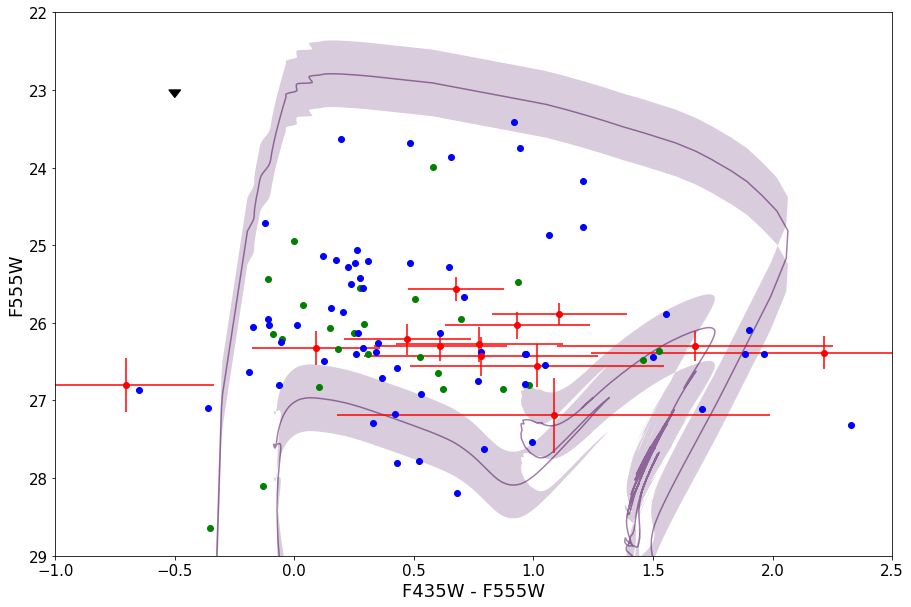

In [20]:
# fix metallicity, vary age
df = isochrones[0]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

#ages = ages[(ages > 7.64) & (ages < 7.66)]
ages = ages[(ages > 8.34) & (ages < 8.36)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(5.63e6) - 1)
    F435W_ext = 0.033 # extinction in F435W in NGC 1566 from NED
    F555W_ext = 0.025 # extinction in F555W in NGC 1566 from NED
    Gal_ext = 0
    # Multiply Gal_ext by A_lambda/E(B-V) values from Schlafly, Finkbeiner 2011
    mag = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
    color = df[idx].ACS_WFC_F435W - df[idx].ACS_WFC_F555W  + F435W_ext - F555W_ext + (3.610 - 2.792) * Gal_ext
    mag_lower = df[idx].ACS_WFC_F555W + dist_lower + F555W_ext + 2.792*red_lower
    mag_upper = df[idx].ACS_WFC_F555W + dist_upper + F555W_ext + 2.792*red_upper
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
line1 = plt.errorbar(new_info3[:,15] - new_info3[:,28], new_info3[:,28], fmt='ro', 
                     xerr=np.sqrt(new_info3[:,17]**2 + new_info3[:,30]**2), yerr=new_info3[:,30])
#line2 = plt.errorbar(new_info2[:,15] - new_info2[:,28], new_info2[:,28], fmt='go', 
#                     xerr=np.sqrt(new_info2[:,17]**2 + new_info2[:,30]**2), yerr=new_info2[:,30])
line2 = plt.plot(new_info2[:,15] - new_info2[:,28], new_info2[:,28], 'go')
#line3 = plt.errorbar(new_info[:,15] - new_info[:,28], new_info[:,28], fmt='bo', 
#                     xerr=np.sqrt(new_info[:,17]**2 + new_info[:,30]**2), yerr=new_info[:,30])
line3 = plt.plot(new_info1[:,15] - new_info1[:,28], new_info1[:,28], 'bo')

# Plots reddening vector
plt.arrow(-0.5, 23, (3.610 - 2.792)*Gal_ext, 2.792*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')

plt.xlabel("F435W - F555W", fontsize=18)
plt.ylabel("F555W", fontsize=18)
plt.ylim(29,22)
plt.xlim(-1, 2.5)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.draw()
plt.show()

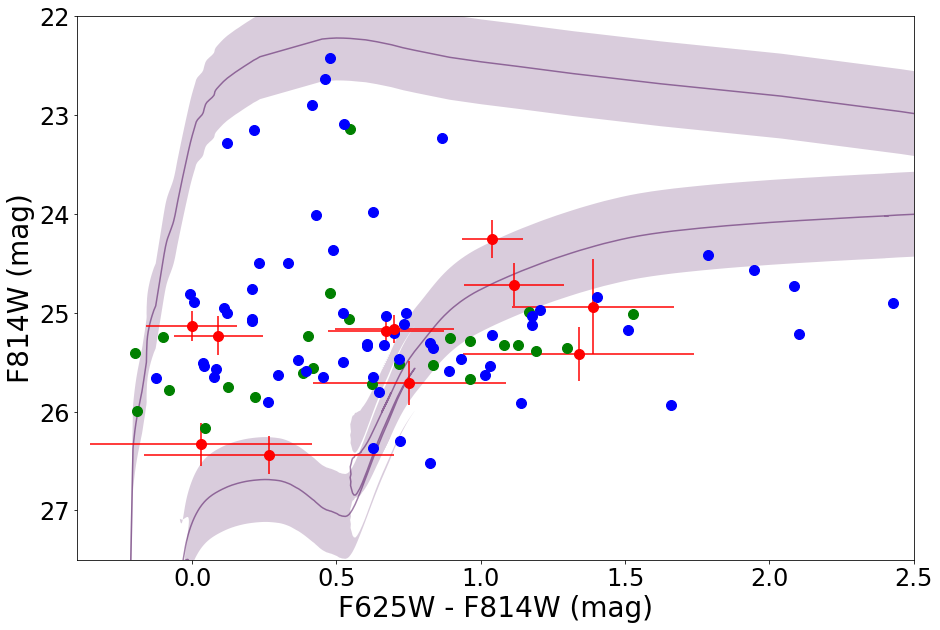

In [21]:
# fix metallicity, vary age
df = isochrones[0.25]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

#ages = ages[(ages > 7.64) & (ages < 7.66)]
ages = ages[(ages > 8.34) & (ages < 8.36)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    F625W_ext = .021 # extinction in F625W in NGC 1566 from NED
    F814W_ext = .014 # extinction in F814W in NGC 1566 from NED
    # Multiply Gal_ext by A_lambda/E(B-V) values from Schlafly, Finkbeiner 2011
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    mag_lower = df[idx].ACS_WFC_F814W + dist_lower + F814W_ext + 1.526*red_lower
    mag_upper = df[idx].ACS_WFC_F814W + dist_upper + F814W_ext + 1.526*red_upper
    color = df[idx].ACS_WFC_F625W - df[idx].ACS_WFC_F814W + F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')

# Plots stars
line1 = plt.errorbar(new_info3[:,41] - new_info3[:,54], new_info3[:,54], fmt='ro', 
                     xerr=np.sqrt(new_info3[:,43]**2 + new_info3[:,56]**2), yerr=new_info3[:,30], markersize=10)
#line2 = plt.errorbar(new_info2[:,15] - new_info2[:,28], new_info2[:,28], fmt='go', 
#                     xerr=np.sqrt(new_info2[:,17]**2 + new_info2[:,30]**2), yerr=new_info2[:,30])
line2 = plt.plot(new_info2[:,41] - new_info2[:,54], new_info2[:,54], 'go', markersize=10)
#line3 = plt.errorbar(new_info[:,15] - new_info[:,28], new_info[:,28], fmt='bo', 
#                     xerr=np.sqrt(new_info[:,17]**2 + new_info[:,30]**2), yerr=new_info[:,30])
line3 = plt.plot(new_info1[:,41] - new_info1[:,54], new_info1[:,54], 'bo', markersize=10)

# Plots reddening vector
plt.arrow(-0.5, 22, (2.219 - 1.526)*Gal_ext, 1.526*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')

plt.xlabel("F625W - F814W (mag)", fontsize=28)
plt.ylabel("F814W (mag)", fontsize=28)
plt.ylim(27.5,22)
plt.xlim(-.4, 2.5)
plt.tick_params(axis='both', which='major', labelsize=24)
plt.draw()
plt.show()

## Fitting isochrones using Crappy Chi-squared test

There are  100.0 stars above signal-to-noise of 10, and  0.0 stars below.


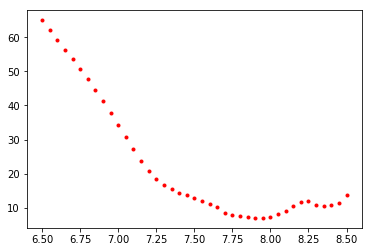

In [41]:
# Reruns through the isochrones the user specifies to get mags, colors, etc.
df = isochrones[.25]
Gal_ext = .205

ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()
ages = ages[(ages >= 6.5) & (ages <= 8.5)]

n_ages = 0
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    mag_435 = df[idx].ACS_WFC_F435W + dist_adjust + F435W_ext + 3.610*Gal_ext
    mag_555 = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
    mag_625 = df[idx].ACS_WFC_F625W + dist_adjust + F625W_ext + 2.219*Gal_ext
    mag_814 = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    age_cmd[age] = (mag_435, mag_555, mag_625, mag_814)
    n_ages += 1


SN_pos = np.array([2417.4288, 1571.5335]) # Sets the SN position in pixels, for radial distance weighting

CChi = np.zeros([2,n_ages]) # This is the array which measure crappy chi-squared across all filters
k = 0 # Counter for progressing through ages in loop
n10SN = 0 # Will represent stars with S/N ratio above 10
nlow = 0 # Will represent stars with S/N ratio below 10
for age, (mag_435, mag_555, mag_625, mag_814) in age_cmd.items():
    phys_dist_temp = 0 # This will hold the total physical distance weights to be averaged and divided out to normalize
    temp = 0 # This will hold the distance for each data point to the line
    
    # Sets the radial dispersion for the region
    sigma = 5 * (.92 * 10**age * 3.15e7 * 206265)/(5.63e6 * 3.086e13 * .05) # Replace 10**age w/ 10000000
    flat = (100 * 206265)/(5.63e6 * .05) # 100 parsecs in pixels
    flat_int = int(np.round(flat*5)) # Coverts the above from pixels to elements in the array
    for j in range(new_info.shape[0]):
        # Removes "stars" with mag > 90 in any band
        if (new_info[j,15] > 90) or (new_info[j,28] > 90) or (new_info[j,41] > 90) or (new_info[j,54] > 90):
            continue
        if new_info[j,5] >= 10:
            n10SN += 1
        else: nlow += 1
        
        # Uses physical distance between star and SN position to weight each star
        phys_dist = np.sqrt((SN_pos[0] - new_info[j,2])**2 + (SN_pos[1] - new_info[j,3])**2)
        # Combines a flat 100 pc distribution with the velocity dispersion over the life of the stars
        weight_func = np.convolve(1/(np.sqrt(2 * np.pi) * sigma) * np.exp(- np.linspace(-200,200,2000)**2/(2 * sigma**2)),
               np.append(np.zeros(int(np.ceil((2000-flat_int)/2))),np.append(np.ones(flat_int),np.zeros(int(np.floor((2000-flat_int)/2))))))
        phys_dist_weight = weight_func[1999 + int(phys_dist*5)]
        phys_dist_temp += phys_dist_weight # Will be used to compute average of the weights
        
        # Adds the difference in mags for each data point in quadrature.
        #temp += phys_dist_weight * np.amin((new_info[j,15] - mag_435)**2/mag_435 + (new_info[j,28] - mag_555)**2/mag_555
        #                + (new_info[j,41] - mag_625)**2/mag_625 + (new_info[j,54] - mag_814)**2/mag_814)
        temp += (phys_dist_weight * np.amin(np.sqrt((new_info[j,15] - mag_435)**2
          + (new_info[j,28] - mag_555)**2 + (new_info[j,41] - mag_625)**2 + (new_info[j,54] - mag_814)**2)))**2
    
    # Divides by the number of stars used, to get average phys_dist weight
    phys_dist_temp /= (new_info.shape[0] - 11) # There are eleven stars removed not counted, as they have >90 mag
    CChi[0,k] = age
    CChi[1,k] = np.sqrt(temp)/phys_dist_temp # Divides by the average phys_dist weight 
    k = k + 1
    
# Ensures that the crappy chi-squared arrays are ordered by age for convenience.
CChi = CChi.T[CChi.T[:,0].argsort()]
plt.plot(CChi.T[0], CChi.T[1], 'r.')
print("There are ", n10SN/n_ages, "stars above signal-to-noise of 10, and ", nlow/n_ages, "stars below.")

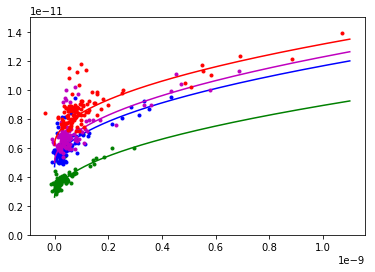

In [33]:
# Testing to find relationship between flux and flux error
x_array=np.linspace(0, 1.1e-9, num=1000)
plt.ylim(0,1.5e-11)

plt.plot(new_info[:,13], new_info[:,14], 'g.')
plt.plot(x_array, 2.6e-12 + 2e-7*np.sqrt(x_array), 'g-')
plt.plot(new_info[:,26], new_info[:,27], 'b.')
plt.plot(x_array, 4.7e-12 + 2.2e-7*np.sqrt(x_array), 'b-')
plt.plot(new_info[:,39], new_info[:,40], 'm.')
plt.plot(x_array, 5e-12 + 2.3e-7*np.sqrt(x_array), 'm-')
plt.plot(new_info[:,52], new_info[:,53], 'r.')
plt.plot(x_array, 6.2e-12 + 2.2e-7*np.sqrt(x_array), 'r-')

In [22]:
import scipy.integrate as integrate
from scipy.optimize import curve_fit
from scipy.stats import skewnorm
# This is the function which will be fed to the fitting algorithm.
def skew(x, norm, a, loc, scale):
    return norm * skewnorm.pdf(x, a, loc=loc, scale=scale)

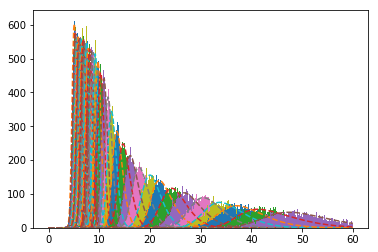

In [30]:
# This cell and the one below are for run fit in magnitude space, using [FeH]=.25
x = np.linspace(0,60,400)
probs1 = []
popt = [8.22619796e+02, 1.65522074e+00, 4.70030465e+00, 6.84856772e-01] # Comes from first fit
for i, age in enumerate(ages):
    filename="MC_10el_MagFit_[FeH]=.25/CChi_false_{Age}.npy".format(Age=np.round(age,decimals=2))
    CChi_false = np.load(filename)
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs1.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,60,401))[0]
    popt, pcov = curve_fit(skew, x, y, p0=popt)
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 60, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs1.append(skew(CChi[i,1], *popt)/norm)

7.7 0.139269163201


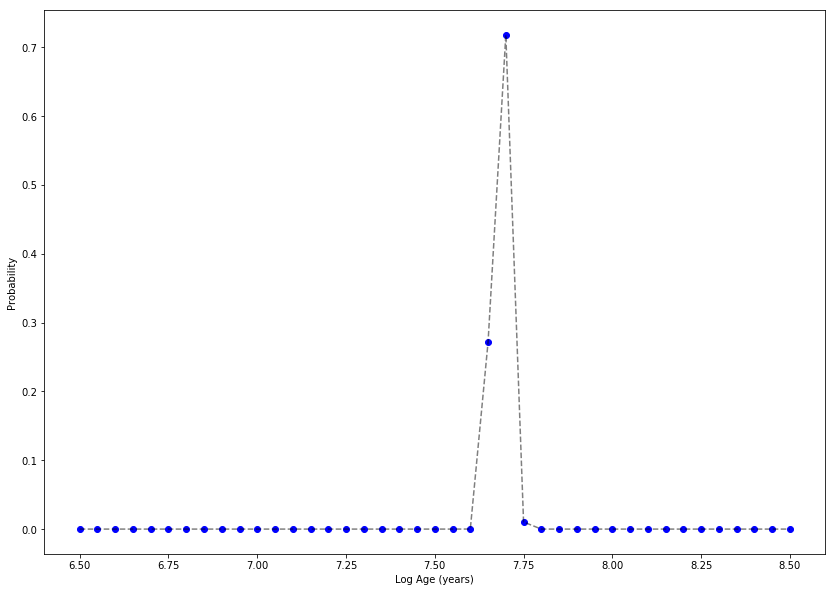

In [31]:
norm1 = np.sum(probs1)
plt.figure(figsize=(14,10));
plt.plot(CChi[:,0], probs1/norm1, 'bo')
plt.plot(CChi[:,0], probs1/norm1, 'k--', alpha=.5)
plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
print(CChi[:,0][np.argmax(probs1)], norm1)

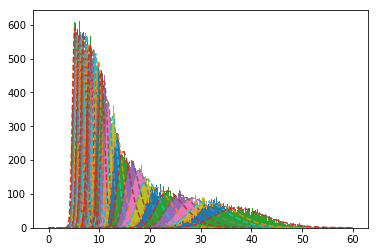

In [34]:
# This cell and the one below are for run fit in magnitude space, using [FeH]=0
x = np.linspace(0,60,400)
probs2 = []
popt = [8.22619796e+02, 1.65522074e+00, 4.70030465e+00, 6.84856772e-01] # Comes from first fit
for i, age in enumerate(ages):
    filename="MC_10el_MagFit_[FeH]=0/CChi_false_{Age}.npy".format(Age=np.round(age,decimals=2))
    CChi_false = np.load(filename)
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs2.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,60,401))[0]
    popt, pcov = curve_fit(skew, x, y, p0=popt)
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 60, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs2.append(skew(CChi[i,1], *popt)/norm)

7.75 0.244275021058


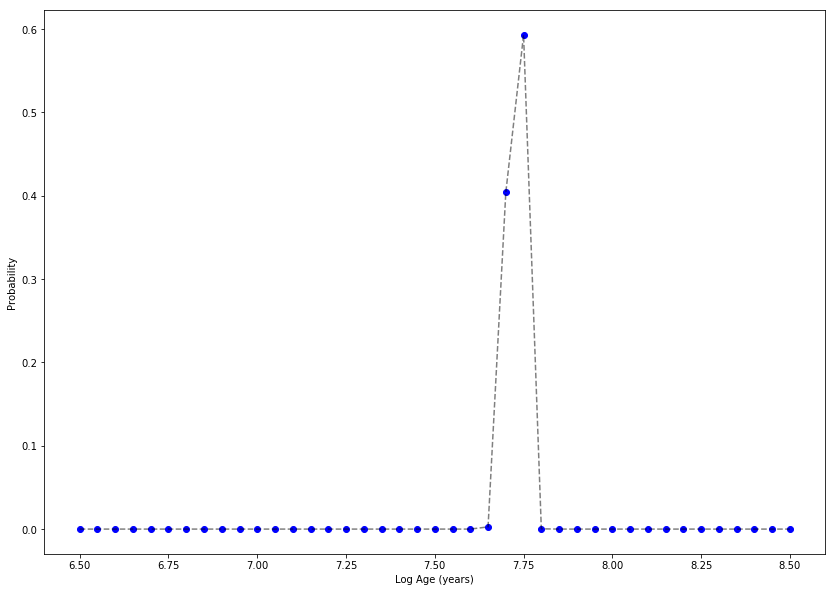

In [35]:
norm2 = np.sum(probs2)
plt.figure(figsize=(14,10));
plt.plot(CChi[:,0], probs2/norm2, 'bo')
plt.plot(CChi[:,0], probs2/norm2, 'k--', alpha=.5)
plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
print(CChi[:,0][np.argmax(probs2)], norm2)

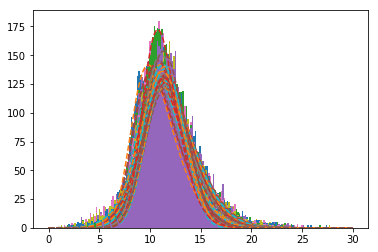

In [37]:
# This cell and the one below are for run fit in magnitude space, using [FeH]=.50
x = np.linspace(0,30,200)
probs3 = []
popt = [8.22619796e+02, 1.65522074e+00, 4.70030465e+00, 6.84856772e-01] # Comes from first fit
for i, age in enumerate(ages):
    filename="MC_10el_MagFit_[FeH]=.50/CChi_false_{Age}.npy".format(Age=np.round(age,decimals=2))
    CChi_false = np.load(filename)
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs3.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,30,201))[0]
    popt, pcov = curve_fit(skew, x, y, p0=popt)
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 30, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs3.append(skew(CChi[i,1], *popt)/norm)

8.35 2.30267865378


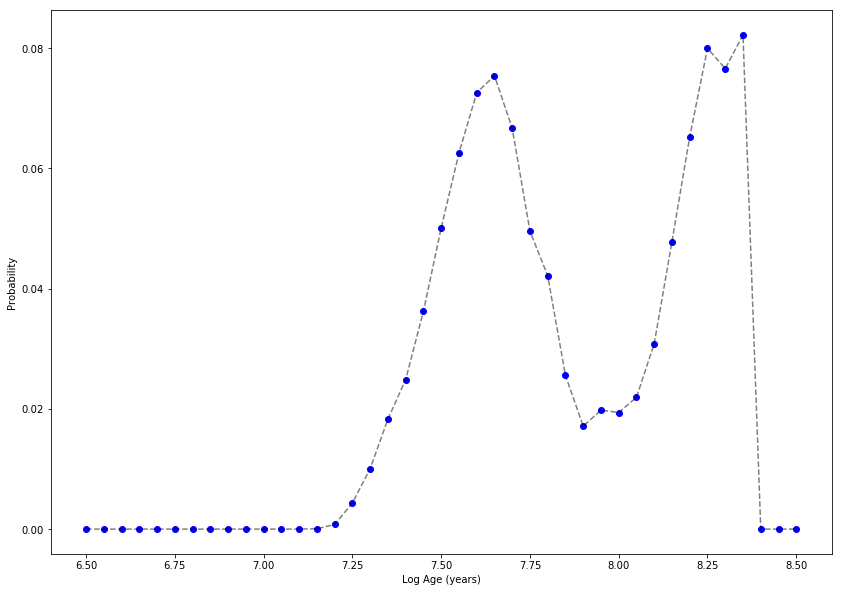

In [38]:
norm3 = np.sum(probs3)
plt.figure(figsize=(14,10));
plt.plot(CChi[:,0], probs3/norm3, 'bo')
plt.plot(CChi[:,0], probs3/norm3, 'k--', alpha=.5)
plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
print(CChi[:,0][np.argmax(probs3)], norm3)

0.139269163201 0.244275021058 2.30267865378


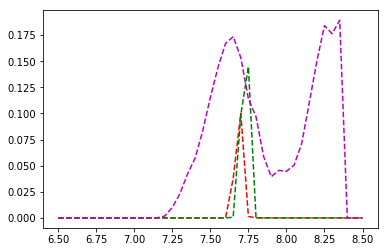

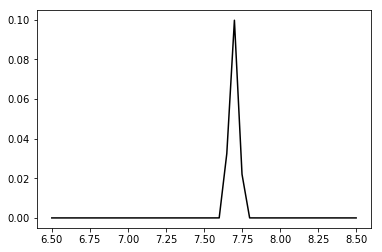

In [88]:
# Combining the probabilities
plt.plot(CChi[:,0], probs1, 'r--', CChi[:,0], probs2, 'g--', CChi[:,0], probs3, 'm--')
print(norm1, norm2, norm3)
plt.show()

# Applying a gaussian prior
mu = .16
sigma = .07
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))
probs_tot = (np.array(probs1) * norm(.25) + np.array(probs2) * norm(0) + np.array(probs3) * norm(.5))/(norm(.25) + norm(0) + norm(.5))
plt.plot(CChi[:,0], probs_tot, 'k')
plt.show()

np.save("Region_files/10el_Mag_probs", probs_tot)

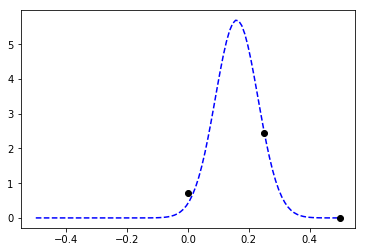

In [40]:
# Compare posterior in metallicity to prior
x_array = np.linspace(-.5,.5,100)
plt.plot(x_array, norm(x_array), 'b--', label='Prior')

plt.plot([0,.25,.5], [7*norm2*norm(0), 7*norm1*norm(.25), 7*norm3*norm(.75)], 'ko')

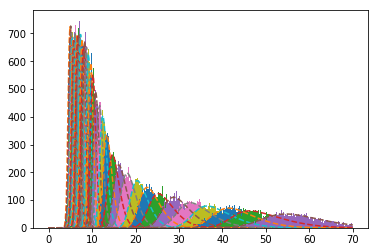

In [42]:
# Now, check fit with metallicity [FeH] = .25, and E(B-V) = .205
x = np.linspace(0,70,400)
probs4 = []
popt = [8.22619796e+02, 1.65522074e+00, 4.70030465e+00, 6.84856772e-01] # Comes from first fit
for i, age in enumerate(ages):
    filename="MC_10el_MagFit_[FeH]=.25_MaxRed/CChi_false_{Age}.npy".format(Age=np.round(age,decimals=2))
    CChi_false = np.load(filename)
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs4.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,70,401))[0]
    popt, pcov = curve_fit(skew, x, y, p0=popt)
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 70, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs4.append(skew(CChi[i,1], *popt)/norm)

7.6 0.648450184076


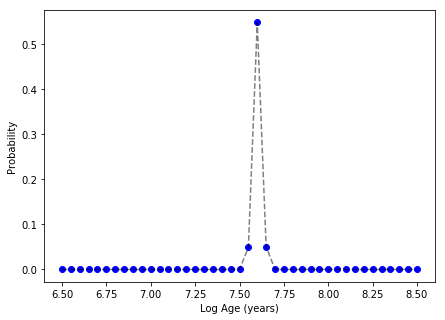

In [43]:
norm4 = np.sum(probs4)
plt.figure(figsize=(7,5));
plt.plot(CChi[:,0], probs4, 'bo')
plt.plot(CChi[:,0], probs4, 'k--', alpha=.5)
plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
print(CChi[:,0][np.argmax(probs4)], norm4)

## Using new data structure

In [22]:
mist_dir = "/Users/tktakaro/Documents/Type-Iax-HST/MIST/ACS-WFC"


kwargs = {"names": ["EEP", "log10_isochrone_age_yr", "initial_mass", "star_mass", "log_Teff", "log_g",
                    "log_L", "[Fe/H]_init", "[Fe/H]", "ACS_WFC_F435W", "ACS_WFC_F475W", "ACS_WFC_F502N",
                    "ACS_WFC_F550M", "ACS_WFC_F555W", "ACS_WFC_F606W", "ACS_WFC_F625W", "ACS_WFC_F658N",
                    "ACS_WFC_F660N", "ACS_WFC_F775W", "ACS_WFC_F814W", "ACS_WFC_F850LP", "ACS_WFC_F892N", "phase"],
         "delim_whitespace": True, "comment": "#"}
isochrones = {}
for filename in glob.glob(mist_dir + "/*.iso.cmd"):
    filename = filename.replace("\\", "/")
    feh_string = filename.split("/")[-1].split("=")[1].split(".iso")[0] # Pulls metalicity information
    feh = float(feh_string) # feh is [Fe/H]
    df = pandas.read_csv(filename, **kwargs)
    df['ages'] = 10 ** df.log10_isochrone_age_yr / 1e9
    isochrones[feh] = df # Creates dictionary accessible by entering a particular metalicity

In [23]:
metallicity = np.array([.02, .09, .16, .23, .30])
reddening = np.array([0, .10254, .20507])
SN_pos = np.array([2417.4288, 1571.5335])
CChi = np.zeros([metallicity.size, reddening.size, 41, 4, 1]) #41 = n_ages

for k, met in enumerate(metallicity):
    df = isochrones[met] # Sets metallicity. Eventually this will be varied over.
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        for i, age in enumerate(ages):
            CChi[k, j, i, 1, :] = met
            CChi[k, j, i, 2, :] = red
            CChi[k, j, i, 3, :] = age
            
            idx = df.log10_isochrone_age_yr == age
            mag_435 = df[idx].ACS_WFC_F435W + dist_adjust + F435W_ext + 3.610*Gal_ext
            mag_555 = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
            mag_625 = df[idx].ACS_WFC_F625W + dist_adjust + F625W_ext + 2.219*Gal_ext
            mag_814 = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
            
            
            phys_dist_temp = 0 # This will hold the total physical distance weights to be averaged and divided out to normalize
            temp = 0 # This will hold the distance for each data point to the line
    
            # Sets the radial dispersion for the region
            sigma = 5 * (.92 * 10**age * 3.15e7 * 206265)/(5.63e6 * 3.086e13 * .05) # Replace 10**age w/ 10000000
            flat = (100 * 206265)/(5.63e6 * .05) # 100 parsecs in pixels
            flat_int = int(np.round(flat*5))
            for l in range(new_info.shape[0]):
                # Removes "stars" with mag > 90 in any band
                if (new_info[l,15] > 90) or (new_info[l,28] > 90) or (new_info[l,41] > 90) or (new_info[l,54] > 90):
                    continue
        
                # Uses physical distance between star and SN position to weight each star
                phys_dist = np.sqrt((SN_pos[0] - new_info[l,2])**2 + (SN_pos[1] - new_info[l,3])**2)
                weight_func = np.convolve(1/(np.sqrt(2 * np.pi) * sigma) * np.exp(- np.linspace(-200,200,2000)**2/(2 * sigma**2)),
                   np.append(np.zeros(int(np.ceil((2000-flat_int)/2))),np.append(np.ones(flat_int),np.zeros(int(np.floor((2000-flat_int)/2))))))
                phys_dist_weight = weight_func[1999 + int(phys_dist*5)]
                phys_dist_temp += phys_dist_weight # Will be used to compute average of the weights
        
                # Adds the difference in mags for each data point in quadrature.
                temp += (phys_dist_weight * np.amin(np.sqrt((new_info[l,15] - mag_435)**2
                  + (new_info[l,28] - mag_555)**2 + (new_info[l,41] - mag_625)**2 + (new_info[l,54] - mag_814)**2)))**2
    
            # There are eleven stars removed not counted, as they have >90 mag in some filter
            phys_dist_temp /= (new_info.shape[0] - 11)
            CChi[k,j,i,0,:] = np.sqrt(temp)/phys_dist_temp

In [25]:
import scipy.integrate as integrate
from scipy.optimize import curve_fit
from scipy.stats import skewnorm
# This is the function which will be fed to the fitting algorithm.
def skew(x, norm, a, loc, scale):
    return norm * skewnorm.pdf(x, a, loc=loc, scale=scale)

In [ ]:
x = np.linspace(0,60,300)
probs = np.zeros([metallicity.size, reddening.size, 41])

CChi_false = np.load("MC_10el_All/CChi_false_ages.npy")
for k, met in enumerate(metallicity):
    df = isochrones[met]
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        popt = [8.22619796e+02, 1.65522074e+00, 4.70030465e+00, 6.84856772e-01] #(2000,3,2,2)
        for i, age in enumerate(ages):
            halt = False
            for l in range(5000):
                if np.isinf(CChi_false[k,j,i,0,l]):
                    CChi_false[k,j,i,0,l] = 999999999999
                    halt = True
                    break
            if halt == True:
                probs[k,j,i] = 0
                continue
            y = plt.hist(CChi_false[k,j,i,0,:], bins=np.linspace(0,60,301))[0]
            try:
                popt, pcov = curve_fit(skew, x, y, p0=(2000,3,2,2))
            except RuntimeError:
                print(met, red, age)
                popt = [.1*p for p in popt]
                popt, pcov = curve_fit(skew, x, y, p0=popt)
            plt.plot(x, skew(x, *popt), '--')
            plt.show()
            norm = integrate.quad(skew, 0, 60, args=(popt[0], popt[1], popt[2], popt[3]))[0]
            probs[k,j,i] = skew(CChi[k,j,i,0,0], *popt)/norm

//anaconda/lib/python3.5/site-packages/scipy/optimize/minpack.py:708: RuntimeWarning: invalid value encountered in multiply
  pcov = pcov * s_sq
//anaconda/lib/python3.5/site-packages/scipy/optimize/minpack.py:715: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


In [ ]:
# Plotting all metallicities, assuming no reddening
plt.figure(figsize=(14,10));
plt.plot(CChi[0, 0, :, 3, 0], probs[0,0,:]/np.sum(probs[0,0,:]), 'r--', alpha=.6, label='[Fe/H]=-.96')
plt.plot(CChi[1, 0, :, 3, 0], probs[1,0,:]/np.sum(probs[1,0,:]), 'm--', alpha=.6, label='[Fe/H]=-.87')
plt.plot(CChi[2, 0, :, 3, 0], probs[2,0,:]/np.sum(probs[2,0,:]), 'b--', alpha=.6, label='[Fe/H]=-.78')
plt.plot(CChi[3, 0, :, 3, 0], probs[3,0,:]/np.sum(probs[3,0,:]), 'c--', alpha=.6, label='[Fe/H]=-.69')
plt.plot(CChi[4, 0, :, 3, 0], probs[4,0,:]/np.sum(probs[4,0,:]), 'g--', alpha=.6, label='[Fe/H]=-.60')

# Applying a gaussian prior
mu = .16
sigma = .07
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_tot = (probs[0,0,:] * norm(.02) + probs[1,0,:] * norm(.09) + probs[2,0,:] * norm(.16) + 
            probs[3,0,:] * norm(.23) + probs[4,0,:] * norm(.30))/(
            norm(.02) + norm(.09) + norm(.16) + norm(.23) + norm(.30))
plt.plot(CChi[0,0,:,3,0], probs_tot/np.sum(probs_tot), 'k', label='Marginalized over metallicity')

plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.legend()
plt.show()

print(CChi[0,0,:,3,0][np.argmax(probs_tot)])
#np.save("Region_files/10el_Mag_probs", probs_tot)

## Making subplots

In [44]:
df = isochrones[.25]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 7.69) & (ages < 7.71)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    mag_lower = df[idx].ACS_WFC_F814W + dist_lower + F814W_ext + 1.526*red_lower
    mag_upper = df[idx].ACS_WFC_F814W + dist_upper + F814W_ext + 1.526*red_upper
    color = df[idx].ACS_WFC_F625W - df[idx].ACS_WFC_F814W + F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')

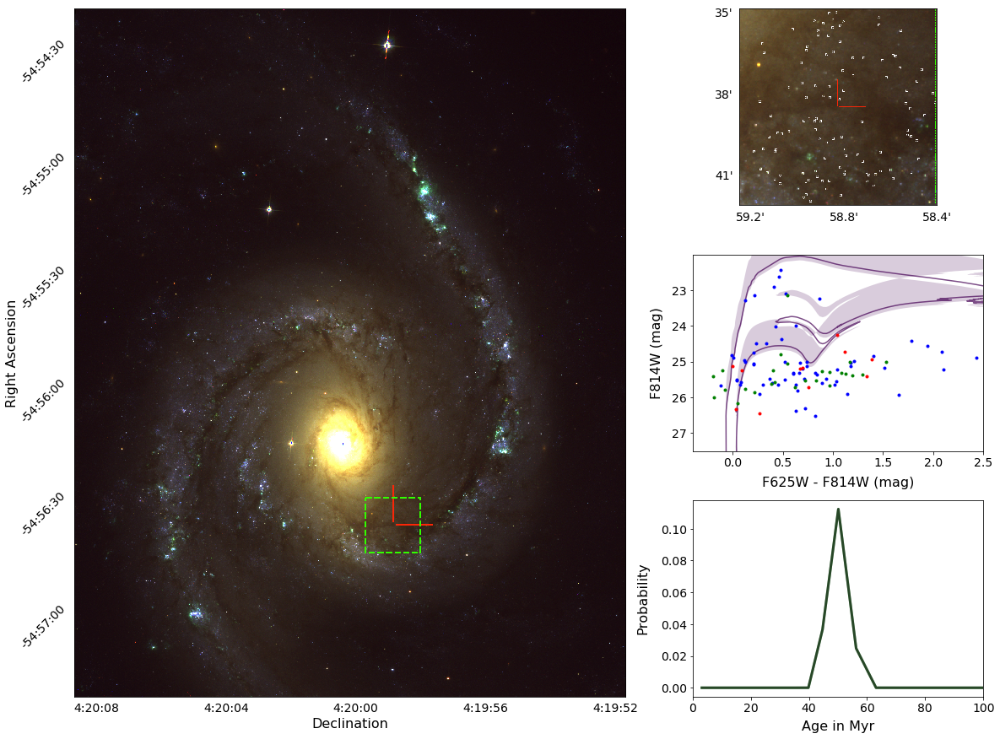

In [86]:
from matplotlib import gridspec
import matplotlib.image as im

# Setup figure and grid
fig = plt.figure(figsize=(20,15))
gs = gridspec.GridSpec(3, 3)
gs.update(wspace=0.12, hspace=0.25)

axis_font = {'size':'16'} # Sets font size
tick_font = {'size':'14'}

ax0 = plt.subplot(gs[:, :-1])
image=im.imread(Iax_dir + '/Iax_Pictures/2010el_4kpc.5kpc.png')
ax0.imshow(image)
x_tick = 703/(68.679 - 51.68)
x_start = x_tick*.679
ax0.set_xticks([x_start, x_start+4*x_tick, x_start+8*x_tick, x_start+12*x_tick, x_start+16*x_tick])
ax0.set_xticklabels(['4:20:08', '4:20:04', '4:20:00', '4:19:56', '4:19:52'], **tick_font)
y_tick = 877/(203.99 - 21.21)
y_start = y_tick*8.79
ax0.set_yticks([y_start, y_start + 30*y_tick, y_start + 60*y_tick,
                y_start + 90*y_tick, y_start + 120*y_tick, y_start + 150*y_tick])
ax0.set_yticklabels(['-54:54:30', '-54:55:00', '-54:55:30', '-54:56:00', '-54:56:30', '-54:57:00'],
                    rotation=45, **tick_font)
ax0.set_xlabel("Declination", **axis_font)
ax0.set_ylabel("Right Ascension", **axis_font)
ax0.xaxis.set_label_coords(.5, -.03)
ax0.xaxis.set_ticks_position('none')
ax0.yaxis.set_label_coords(-.1, .5)
ax0.yaxis.set_ticks_position('none')

ax1 = plt.subplot(gs[0,-1])
image=im.imread(Iax_dir + '/Iax_Pictures/2010el_400pc.400pc.png')
ax1.imshow(image)
x_tick = 878/(59.25 - 58.405)
x_start = x_tick*.05
ax1.set_xticks([x_start, x_start + .4*x_tick, x_start + .8*x_tick])
ax1.set_xticklabels(["59.2'", "58.8'", "58.4'"], **tick_font)
y_tick = 877/(42.12 - 34.88)
y_start = y_tick*.12
ax1.set_yticks([y_start, y_start + 3*y_tick, y_start + 6*y_tick])
ax1.set_yticklabels(["35'", "38'", "41'"], **tick_font)
ax1.xaxis.set_label_coords(.5, -.18)
ax1.xaxis.set_ticks_position('none')
ax1.yaxis.set_label_coords(-.45, .5)
ax1.yaxis.set_ticks_position('none')

ax2 = plt.subplot(gs[1,-1])
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    ax2.plot(color, mag, alpha=0.7, color=sm.to_rgba(age), zorder=0)
    ax2.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
# Plots stars
line1 = ax2.plot(new_info1[:,41] - new_info1[:,54], new_info1[:,54], 'b.')
line2 = ax2.plot(new_info2[:,41] - new_info2[:,54], new_info2[:,54], 'g.')
line3 = ax2.plot(new_info3[:,41] - new_info3[:,54], new_info3[:,54], 'r.')

ax2.set_xlabel("F625W - F814W (mag)", **axis_font)
ax2.set_ylabel("F814W (mag)", **axis_font)
ax2.xaxis.set_label_coords(.5, -.13)
ax2.yaxis.set_label_coords(-.1, .5)
ax2.set_ylim(27.5,22)
ax2.set_xlim(-.4, 2.5)
ax2.tick_params(axis='both', which='major', labelsize=14)
ax2.set_yticks(np.arange(23, 28))

ax3 = plt.subplot(gs[2,-1])
norm_linear = np.trapz(probs_tot, 10**(CChi[:,0])/1e6)
ax3.plot(10**(CChi[:,0])/1e6, probs_tot/norm_linear, 'g-', alpha=.6, linewidth=3)
ax3.plot(10**(CChi[:,0])/1e6, probs_tot/norm_linear, 'k-', alpha=.6, linewidth=3)
ax3.set_xlabel("Age in Myr", **axis_font)
ax3.set_ylabel("Probability", **axis_font)
ax3.xaxis.set_label_coords(.5, -.12)
ax3.yaxis.set_label_coords(-.15, .5)
ax3.set_xlim(0,100)
ax3.tick_params(axis='both', which='major', labelsize=14)
ax3.set_yticks(np.arange(0, .12, .02));

plt.savefig('2010el_Fig.pdf', dpi=1000)

## Now, using the dolphot output's from my run

In [2]:
Iax_dir = "/Users/tktakaro/Documents/Type-Iax-HST" #"D:/Research/Type-Iax-HST"
catalog_new = np.loadtxt(Iax_dir+"/new_files/sn2010el/sn2010el") #final/sn2010el")

In [3]:
pos_predict_new = np.zeros((catalog_new.shape[0],2))
info_predict_new = np.zeros(np.shape(catalog_new))

j = 0 # Iteration variable for positions array
for i in range(catalog_new.shape[0]): # Cycles through each object in catalog
    # Checks to make sure point is "good"
    # Good defined by: 1. S/N > 3.5     2. Sharpness < .3     3. Roundness < 1     4. Crowding < .1 
    if ((catalog_new[i][5] >= 3.5)&(abs(catalog_new[i][6]) < .3)&(abs(catalog_new[i][7]) < 1)
        &(catalog_new[i][9] < .1)):
        pos_predict_new[j][0] = catalog_new[i][2] # Assigns X position
        pos_predict_new[j][1] = catalog_new[i][3] # Assigns Y position
        info_predict_new[j] = catalog_new[i]
        j = j + 1
                
# Trims all zeros from end of positions array, left from "bad" objects
pos_predict_new = pos_predict_new[~np.all(pos_predict_new == 0, axis=1)]
info_predict_new = info_predict_new[~np.all(info_predict_new == 0, axis=1)]

# Saves high S/N object X,Y positions
np.savetxt("New_Start(2017)/sn2010el_Prediction_new.reg", pos_predict_new, '%5.2f')

In [4]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2010el_200pc_new.reg", "r+")

def mysplit(s, delim=None):
    return [x for x in s.split(delim) if x]

text = asci.readlines()
region = np.zeros([86,2])
for i in range(86):
    region[i][0] = mysplit(text[i], ' ')[0]
    region[i][1] = mysplit(text[i], ' ')[1]
region = region[~np.all(region == 0, axis=1)]

# Info for each star chosen as real 
info_new = np.zeros([region.shape[0],info_predict_new.shape[1]])

j = 0 # Iteration variable for region array
for i in range(info_predict_new.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == pos_predict_new[i][0])&(region[j][1] == pos_predict_new[i][1]):
        info_new[j] = info_predict_new[i]
        j = j + 1
        if j == region.shape[0]: break

In [5]:
# Using IRAF to compute actual concentration index, i.e. photometry at .5 pixels to photometry at 3 pixels
ascii_1 = open(Iax_dir + "/new_files/sn2010el/final_F625W_crc1.mag.1")
ascii_2 = open(Iax_dir + "/new_files/sn2010el/final_F625W_crc1.mag.2")
text_1 = ascii_1.readlines()
text_2 = ascii_2.readlines()

concentration = np.zeros(86)
for i in range(86):
    if mysplit(text_1[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at .5 pixels
        concentration[i] = 99
    elif mysplit(text_2[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at 3 pixels
        concentration[i] = -99
    else: concentration[i] = float(mysplit(text_1[5*i + 79])[4]) - float(mysplit(text_2[5*i + 79])[4])
ascii_1.close()
ascii_2.close()

(0, -10)

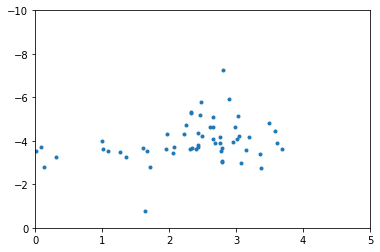

In [6]:
plt.plot(concentration, info_new[:,41] - 5*(np.log10(5.63e6) - 1), '.')
plt.xlim(0,5)
plt.ylim(0,-10)

In [7]:
# Cut out clusters (identified as objects with concentration parameter < 2.3, from Chandar et. al. 2010)
info = np.zeros(info_new.shape)
for i in range(86):
    if (concentration[i] < 2.3): #not ((concentration[i] > 2.5) and (info_new[i,41] - 5*(np.log10(5.63e6) - 1) < -5)):
        info[i] = info_new[i]
info = info[~np.all(info == 0, axis=1)]

np.savetxt("Region_files/sn2010el_NoClustersROI_new.reg", info[:,2:4], '%5.2f')

In [8]:
print(info.shape)

(46, 271)


In [9]:
import matplotlib as mpl
mist_dir = "/Users/tktakaro/Documents/Type-Iax-HST/MIST/ACS-WFC"


kwargs = {"names": ["EEP", "log10_isochrone_age_yr", "initial_mass", "star_mass", "log_Teff", "log_g",
                    "log_L", "[Fe/H]_init", "[Fe/H]", "ACS_WFC_F435W", "ACS_WFC_F475W", "ACS_WFC_F502N",
                    "ACS_WFC_F550M", "ACS_WFC_F555W", "ACS_WFC_F606W", "ACS_WFC_F625W", "ACS_WFC_F658N",
                    "ACS_WFC_F660N", "ACS_WFC_F775W", "ACS_WFC_F814W", "ACS_WFC_F850LP", "ACS_WFC_F892N", "phase"],
         "delim_whitespace": True, "comment": "#"}
isochrones = {}
for filename in glob.glob(mist_dir + "/*.iso.cmd"):
    filename = filename.replace("\\", "/")
    feh_string = filename.split("/")[-1].split("=")[1].split(".iso")[0] # Pulls metalicity information
    feh = float(feh_string) # feh is [Fe/H]
    df = pandas.read_csv(filename, **kwargs)
    df['ages'] = 10 ** df.log10_isochrone_age_yr / 1e9
    isochrones[feh] = df # Creates dictionary accessible by entering a particular metalicity

In [10]:
# Reddening, metallicity, and distance errors
dist_lower = 5 * (np.log10(4.62e6) - 1)
dist_upper = 5 * (np.log10(6.86e6) - 1)
red_lower = 0
red_upper = 0

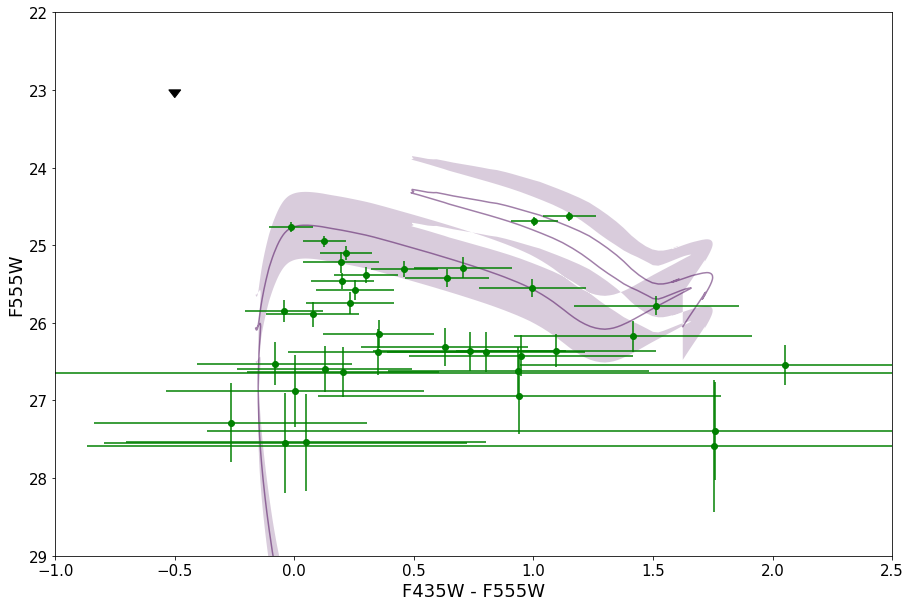

In [11]:
# fix metallicity, vary age
df = isochrones[.16]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 7.74) & (ages < 7.76)]
#ages = ages[(ages > 8.34) & (ages < 8.36)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(5.63e6) - 1)
    F435W_ext = 0.033 # extinction in F435W in NGC 1566 from NED
    F555W_ext = 0.025 # extinction in F555W in NGC 1566 from NED
    Gal_ext = 0
    # Multiply Gal_ext by A_lambda/E(B-V) values from Schlafly, Finkbeiner 2011
    mag = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
    color = df[idx].ACS_WFC_F435W - df[idx].ACS_WFC_F555W  + F435W_ext - F555W_ext + (3.610 - 2.792) * Gal_ext
    mag_lower = df[idx].ACS_WFC_F555W + dist_lower + F555W_ext + 2.792*red_lower
    mag_upper = df[idx].ACS_WFC_F555W + dist_upper + F555W_ext + 2.792*red_upper
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
line1 = plt.errorbar(info[:,15] - info[:,28], info[:,28], fmt='go', 
                     xerr=np.sqrt(info[:,17]**2 + info[:,30]**2), yerr=info[:,30])

# Plots reddening vector
plt.arrow(-0.5, 23, (3.610 - 2.792)*Gal_ext, 2.792*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')

plt.xlabel("F435W - F555W", fontsize=18)
plt.ylabel("F555W", fontsize=18)
plt.ylim(29,22)
plt.xlim(-1, 2.5)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.draw()
plt.show()

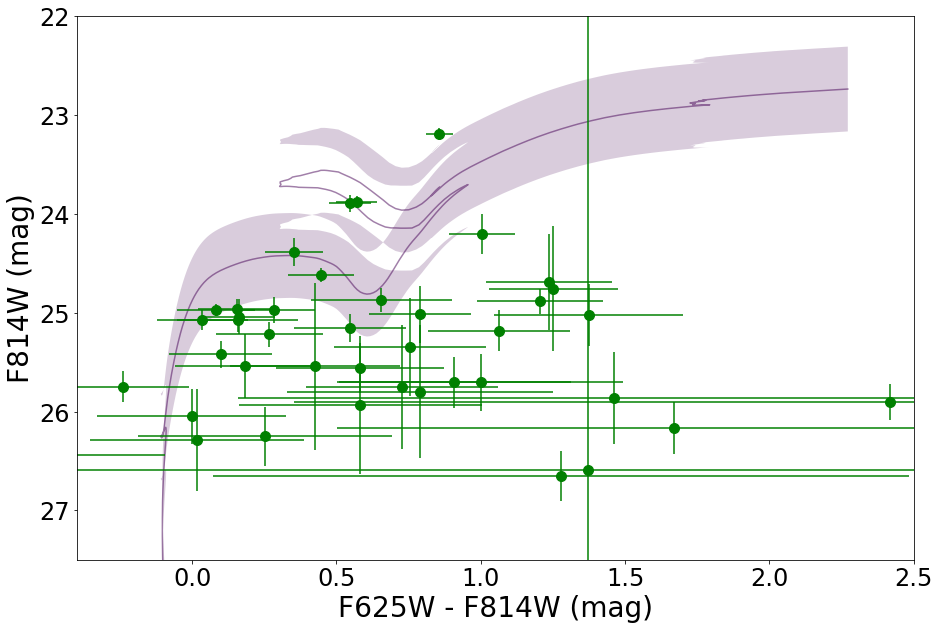

In [12]:
# fix metallicity, vary age
df = isochrones[0.16]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 7.74) & (ages < 7.76)]
#ages = ages[(ages > 8.34) & (ages < 8.36)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    F625W_ext = .021 # extinction in F625W in NGC 1566 from NED
    F814W_ext = .014 # extinction in F814W in NGC 1566 from NED
    # Multiply Gal_ext by A_lambda/E(B-V) values from Schlafly, Finkbeiner 2011
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    mag_lower = df[idx].ACS_WFC_F814W + dist_lower + F814W_ext + 1.526*red_lower
    mag_upper = df[idx].ACS_WFC_F814W + dist_upper + F814W_ext + 1.526*red_upper
    color = df[idx].ACS_WFC_F625W - df[idx].ACS_WFC_F814W + F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')

# Plots stars
line1 = plt.errorbar(info[:,41] - info[:,54], info[:,54], fmt='go', 
                     xerr=np.sqrt(info[:,43]**2 + info[:,56]**2), yerr=info[:,30], markersize=10)

# Plots reddening vector
plt.arrow(-0.5, 22, (2.219 - 1.526)*Gal_ext, 1.526*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')

plt.xlabel("F625W - F814W (mag)", fontsize=28)
plt.ylabel("F814W (mag)", fontsize=28)
plt.ylim(27.5,22)
plt.xlim(-.4, 2.5)
plt.tick_params(axis='both', which='major', labelsize=24)
plt.draw()
plt.show()

In [13]:
print(info.shape)

(46, 271)


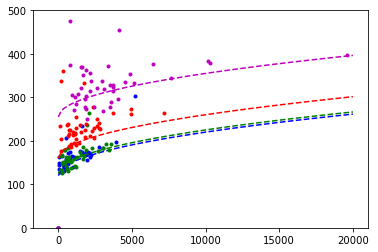

In [14]:
# Testing to find relationship between flux and flux error
x_array=np.linspace(0, 20000, num=100)

plt.plot(info[:,11], info[:,17]/1.0857 * info[:,11], 'b.')
plt.plot(x_array, 120 + np.sqrt(x_array), 'b--')
plt.plot(info[:,24], info[:,30]/1.0857 * info[:,24], 'g.')
plt.plot(x_array, 125 + np.sqrt(x_array), 'g--')
plt.plot(info[:,37], info[:,43]/1.0857 * info[:,37], 'r.')
plt.plot(x_array, 160 + np.sqrt(x_array), 'r--')
plt.plot(info[:,50], info[:,56]/1.0857 * info[:,50], 'm.')
plt.plot(x_array, 255 + np.sqrt(x_array), 'm--')
plt.ylim(0,500)
plt.show()

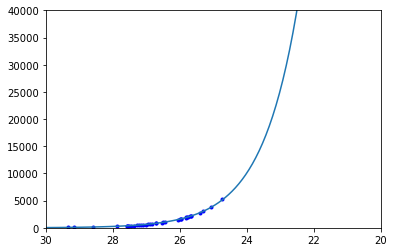

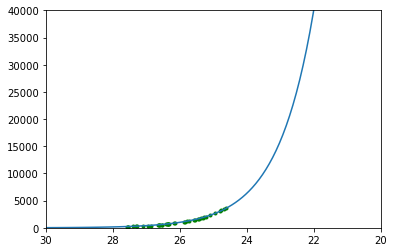

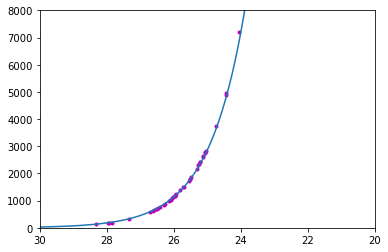

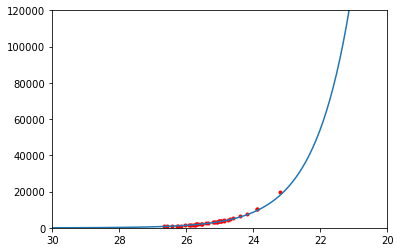

In [15]:
x_array = np.linspace(20,30,100)
plt.ylim(0,40000)
plt.xlim(30,20)
plt.plot(info[:,15], info[:,11], 'b.')
plt.plot(x_array, 1.7*1168 * 10**((25.769 - x_array)/2.5))
plt.show()

plt.ylim(0,40000)
plt.xlim(30,20)
plt.plot(info[:,28], info[:,24], 'g.')
plt.plot(x_array, 1.7*768 * 10**((25.722 - x_array)/2.5))
plt.show()

plt.ylim(0,8000)
plt.xlim(30,20)
plt.plot(info[:,41], info[:,37], 'm.')
plt.plot(x_array, 1.7*844 * 10**((25.743 - x_array)/2.5))
plt.show()

plt.ylim(0,120000)
plt.xlim(30,20)
plt.plot(info[:,54], info[:,50], 'r.')
plt.plot(x_array, 1.7*1244 * 10**((25.525 - x_array)/2.5))
plt.show()

In [16]:
metallicity = np.array([.02, .09, .16, .23, .30])
reddening = np.array([0, .10254, .20507])
SN_pos = np.array([2427.6661, 1530.8345]) #([1777.1903, 1896.8087])
CChi = np.zeros([metallicity.size, reddening.size, 41, 4, 1]) #41 = n_ages


for k, met in enumerate(metallicity):
    df = isochrones[met] # Sets metallicity. Eventually this will be varied over.
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        for i, age in enumerate(ages):
            CChi[k, j, i, 1, :] = met
            CChi[k, j, i, 2, :] = red
            CChi[k, j, i, 3, :] = age
            
            idx = df.log10_isochrone_age_yr == age
            mag_435 = df[idx].ACS_WFC_F435W + dist_adjust + F435W_ext + 3.610*red
            mag_555 = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*red
            mag_625 = df[idx].ACS_WFC_F625W + dist_adjust + F625W_ext + 2.219*red
            mag_814 = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*red
            
            
            phys_dist_temp = 0 # This will hold the total physical distance weights to be averaged and divided out to normalize
            temp = 0 # This will hold the distance for each data point to the line
    
            # Sets the radial dispersion for the region
            sigma = 5 * (.92 * 10**age * 3.15e7 * 206265)/(5.63e6 * 3.086e13 * .05) # Replace 10**age w/ 10000000
            flat = (100 * 206265)/(5.63e6 * .05) # 100 parsecs in pixels
            flat_int = int(np.round(flat*5))
            for l in range(info.shape[0]):
                # Removes "stars" with mag > 90 in any band
                if (info[l,15] > 90) or (info[l,28] > 90) or (info[l,41] > 90) or (info[l,54] > 90):
                    continue
        
                # Uses physical distance between star and SN position to weight each star
                phys_dist = np.sqrt((SN_pos[0] - info[l,2])**2 + (SN_pos[1] - info[l,3])**2)
                weight_func = np.convolve(1/(np.sqrt(2 * np.pi) * sigma) * np.exp(- np.linspace(-200,200,2000)**2/(2 * sigma**2)),
                   np.append(np.zeros(int(np.ceil((2000-flat_int)/2))),np.append(np.ones(flat_int),np.zeros(int(np.floor((2000-flat_int)/2))))))
                phys_dist_weight = weight_func[1999 + int(phys_dist*5)]
                phys_dist_temp += phys_dist_weight # Will be used to compute average of the weights
        
                # Adds the difference in mags for each data point in quadrature.
                temp += (phys_dist_weight * np.amin(np.sqrt((info[l,15] - mag_435)**2
                  + (info[l,28] - mag_555)**2 + (info[l,41] - mag_625)**2 + (info[l,54] - mag_814)**2)))**2
    
            # There are eleven stars not counted, as they have >90 mag in some filter
            phys_dist_temp /= (info.shape[0] - 10) #12)
            CChi[k,j,i,0,:] = np.sqrt(temp)/phys_dist_temp

In [17]:
import scipy.integrate as integrate
from scipy.optimize import curve_fit
from scipy.stats import skewnorm
# This is the function which will be fed to the fitting algorithm.
def skew(x, norm, a, loc, scale):
    return norm * skewnorm.pdf(x, a, loc=loc, scale=scale)

In [18]:
print(info.shape)

(46, 271)


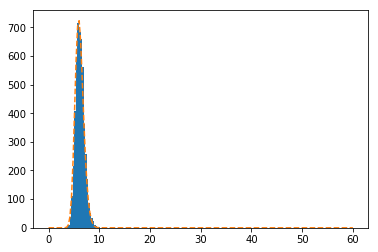

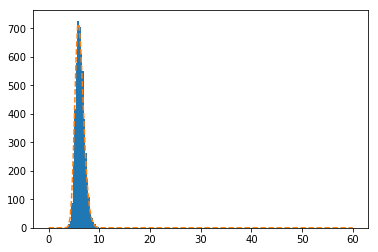

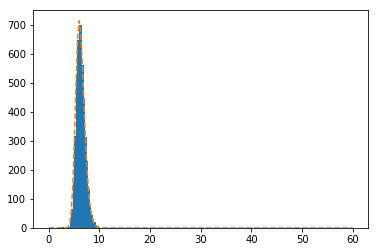

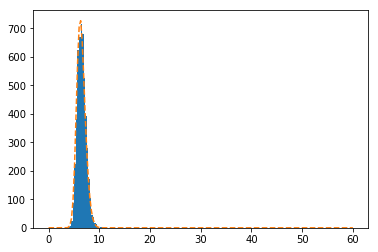

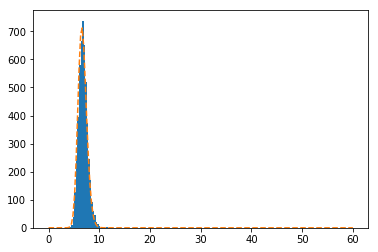

...

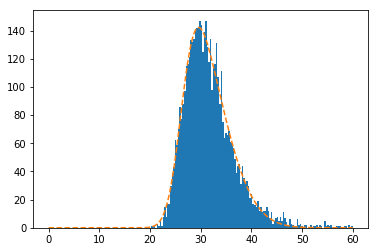

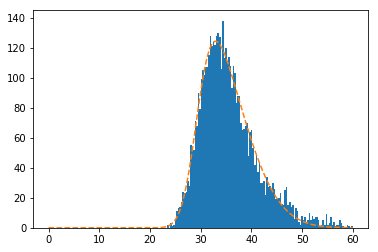

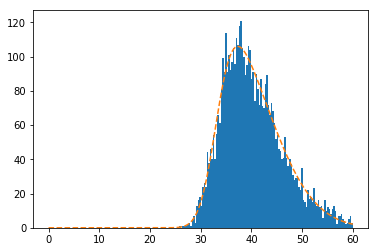

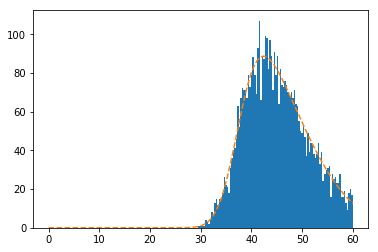

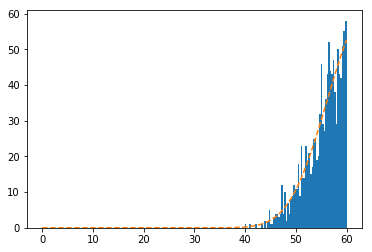

In [19]:
x = np.linspace(0,60,200)
probs = np.zeros([metallicity.size, reddening.size, 41]) #[]

CChi_false = np.load("MC_10el_Complete/CChi_false_ages.npy") #"MC_10el_Curtis_Dolphot/CChi_false_ages.npy")
for k, met in enumerate(metallicity):
    df = isochrones[met]
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        popt = (2000,3,2,2)
        for i, age in enumerate(ages):
            halt = False
            for l in range(5000):
                if np.isinf(CChi_false[k,j,i,0,l]) or np.isnan(CChi_false[k,j,i,0,l]):
                    CChi_false[k,j,i,0,l] = 999999999999
                    halt = True
                    probs[k,j,i] = 0
                    break
            if halt == True:
                probs[k,j,i] = 0
                continue
            y = plt.hist(82./49. * CChi_false[k,j,i,0,:], bins=np.linspace(0,60,201))[0]
            try:
                popt, pcov = curve_fit(skew, x, y, p0=popt)
            except RuntimeError:
                print(met, red, age)
                popt = [.1 * p for p in popt]
                popt, pcov = curve_fit(skew, x, y, p0=popt)
            plt.plot(x, skew(x, *popt), '--')
            plt.show()
            norm = integrate.quad(skew, 0, 60, args=(popt[0], popt[1], popt[2], popt[3]))[0]
            probs[k,j,i] = skew(CChi[k,j,i,0,0], *popt)/norm

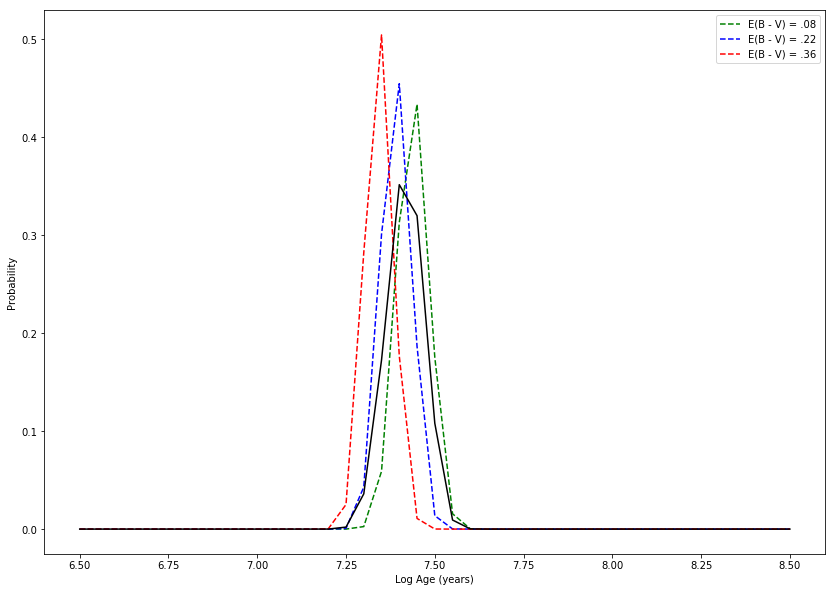

7.4


In [20]:
# Plotting different reddening values, marginalizing over metallicity prior
plt.figure(figsize=(14,10));

# Applying a gaussian prior
mu = 0.16
sigma = .07
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_red0 = (probs[0,0,:] * norm(.02) + probs[1,0,:] * norm(.09) + probs[2,0,:] * norm(.16) + 
            probs[3,0,:] * norm(.23) + probs[4,0,:] * norm(.30))/(
            norm(.02) + norm(.09) + norm(.16) + norm(.23) + norm(.30))
probs_red1 = (probs[0,1,:] * norm(.02) + probs[1,1,:] * norm(.09) + probs[2,1,:] * norm(.16) + 
            probs[3,1,:] * norm(.23) + probs[4,1,:] * norm(.30))/(
            norm(.02) + norm(.09) + norm(.16) + norm(.23) + norm(.30))
probs_red2 = (probs[0,2,:] * norm(.02) + probs[1,2,:] * norm(.09) + probs[2,2,:] * norm(.16) + 
            probs[3,2,:] * norm(.23) + probs[4,2,:] * norm(.30))/(
            norm(.02) + norm(.09) + norm(.16) + norm(.23) + norm(.30))

plt.plot(CChi[0,1,:,3,0], probs_red0/np.sum(probs_red0), 'g--', label='E(B - V) = .08')
plt.plot(CChi[0,1,:,3,0], probs_red1/np.sum(probs_red1), 'b--', label='E(B - V) = .22')
plt.plot(CChi[0,1,:,3,0], probs_red2/np.sum(probs_red2), 'r--', label='E(B - V) = .36')

mu = 0
sigma = .10254
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_tot = (probs_red0 * norm(0) + probs_red1 * norm(.10254) + 
            probs_red2 * norm(.20507))
plt.plot(CChi[0,1,:,3,0], probs_tot/np.sum(probs_tot), 'k')

plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.legend()
plt.show()

print(CChi[0,1,:,3,0][np.argmax(probs_tot)])
#np.save("Region_files/10el_Mag_probs_clusters", probs_tot)

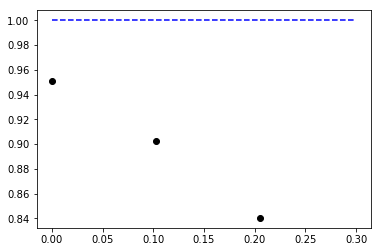

In [21]:
# Compare posterior in reddening to prior
x_array = np.linspace(0,.3,100)
y_const = np.ones(100)

norm_red0 = np.sum(probs_red0)
norm_red1 = np.sum(probs_red1)
norm_red2 = np.sum(probs_red2)

mu = .20507
sigma = .10254
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))
#plt.plot(x_array, norm(x_array), 'b--', label='Prior')
#plt.plot(reddening, [.9*norm_red0*norm(0), .9*norm_red1*norm(0.10254), .9*norm_red2*norm(0.20507)], 'ko')
plt.plot(x_array, y_const, 'b--')
plt.plot(reddening, [norm_red0, norm_red1, norm_red2], 'ko')

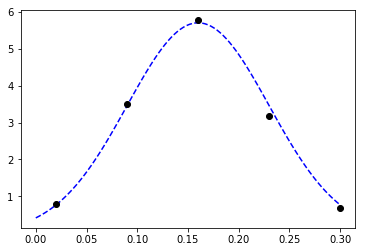

In [22]:
# Compare posterior in metallicity to prior
probs_met0 = (probs[0,0,:] + probs[0,1,:] + probs[0,2,:])
probs_met1 = (probs[1,0,:] + probs[1,1,:] + probs[1,2,:])
probs_met2 = (probs[2,0,:] + probs[2,1,:] + probs[2,2,:])
probs_met3 = (probs[3,0,:] + probs[3,1,:] + probs[3,2,:])
probs_met4 = (probs[4,0,:] + probs[4,1,:] + probs[4,2,:])

norm_met0 = np.sum(probs_met0)
norm_met1 = np.sum(probs_met1)
norm_met2 = np.sum(probs_met2)
norm_met3 = np.sum(probs_met3)
norm_met4 = np.sum(probs_met4)

mu = 0.16
sigma = .07
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

x_array = np.linspace(0,.3,100)
plt.plot(x_array, norm(x_array), 'b--')
plt.plot(metallicity, [.365*norm_met0*norm(0.02), .365*norm_met1*norm(0.09), .365*norm_met2*norm(0.16),
                       .365*norm_met3*norm(0.23), .365*norm_met4*norm(0.30)], 'ko')

23.2162162162
26.4864864865
30.0540540541


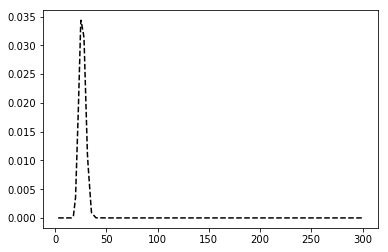

In [23]:
x_interp = np.linspace(3, 300, 1000)
pdf_interp = np.interp(x_interp, (10**CChi[0,0,:,3,0])/1e6, probs_tot[:])

plt.plot(x_interp, pdf_interp/np.sum(pdf_interp), 'k--')

cdf_array = np.zeros([pdf_interp.shape[0], 2])
for i in range(pdf_interp.shape[0]):
    cdf_array[i,0] = x_interp[i]
    cdf_array[i,1] = np.sum(pdf_interp[:i+1])/np.sum(pdf_interp[:])
    
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - (1 - .6827)/2.))])
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - .5))])
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - (1 + .6827)/2.))])

## Subplot for paper

In [27]:
d200 = 147 # 200 pc onsky in pixels
d133 = (2./3) * d200
d67 = (1./3) * d200

info200 = np.zeros(info.shape) # Information for stars between 133 and 200 pc away
info133 = np.zeros(info.shape) # Information for stars between 67 and 133 pc away
info67 = np.zeros(info.shape) # Information for stars less than 67 pc away

for i in range(info.shape[0]):
    d = np.sqrt(np.sum((info[i,2:4] - SN_pos)**2))
    if d <= d67:
        info67[i] = info[i]
    elif d <= d133:
        info133[i] = info[i]
    elif d <= d200:
        info200[i] = info[i]
    else:
        print('Error: object is too far from SN')

info200 = info200[~np.all(info200 == 0, axis=1)]
info133 = info133[~np.all(info133 == 0, axis=1)]
info67 = info67[~np.all(info67 == 0, axis=1)]

In [28]:
print(info67.shape, info133.shape, info200.shape)

(6, 271) (11, 271) (29, 271)


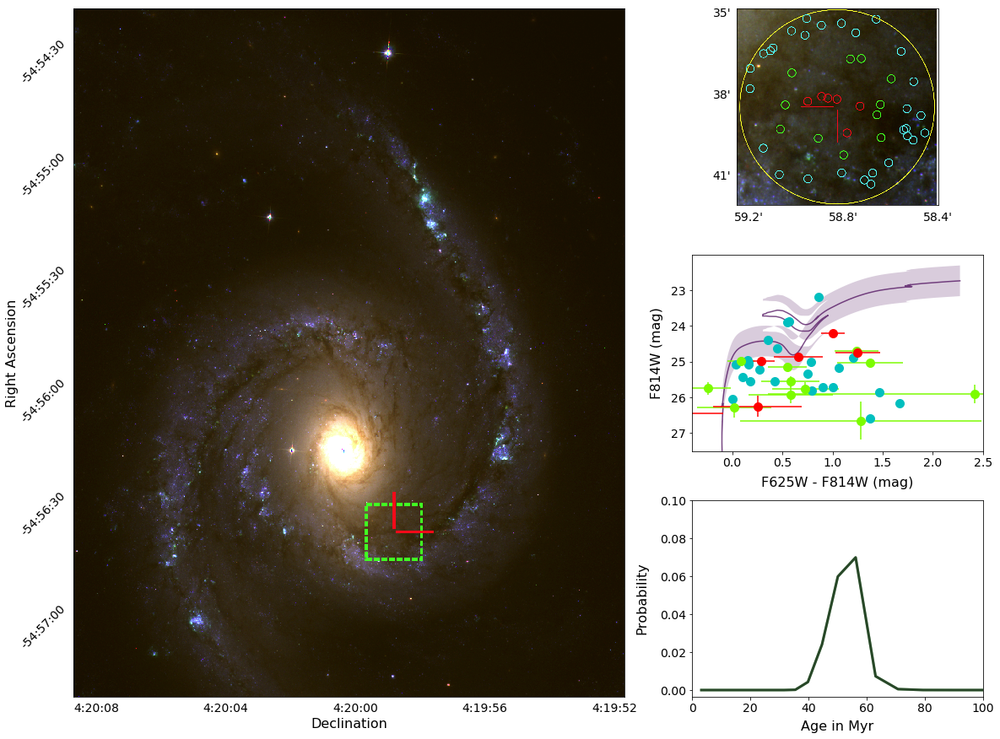

In [58]:
from matplotlib import gridspec
import matplotlib.image as im

# Setup figure and grid
fig = plt.figure(figsize=(20,15))
gs = gridspec.GridSpec(3, 3)
gs.update(wspace=0.12, hspace=0.25)

axis_font = {'size':'16'} # Sets font size
tick_font = {'size':'14'}

ax0 = plt.subplot(gs[:, :-1])
image=im.imread(Iax_dir + '/Iax_Pictures/2010el_4kpc.5kpc.png')
ax0.imshow(image)
x_tick = 794/(68.679 - 51.68)
x_start = x_tick*.679
ax0.set_xticks([x_start, x_start+4*x_tick, x_start+8*x_tick, x_start+12*x_tick, x_start+16*x_tick])
ax0.set_xticklabels(['4:20:08', '4:20:04', '4:20:00', '4:19:56', '4:19:52'], **tick_font)
y_tick = 992/(203.99 - 21.21)
y_start = y_tick*8.79
ax0.set_yticks([y_start, y_start + 30*y_tick, y_start + 60*y_tick,
                y_start + 90*y_tick, y_start + 120*y_tick, y_start + 150*y_tick])
ax0.set_yticklabels(['-54:54:30', '-54:55:00', '-54:55:30', '-54:56:00', '-54:56:30', '-54:57:00'],
                    rotation=45, **tick_font)
ax0.set_xlabel("Declination", **axis_font)
ax0.set_ylabel("Right Ascension", **axis_font)
ax0.xaxis.set_label_coords(.5, -.03)
ax0.xaxis.set_ticks_position('none')
ax0.yaxis.set_label_coords(-.1, .5)
ax0.yaxis.set_ticks_position('none')

ax1 = plt.subplot(gs[0,-1])
image=im.imread(Iax_dir + '/Iax_Pictures/2010el_400pc.400pc.png')
ax1.imshow(image)
x_tick = 1008/(59.25 - 58.405)
x_start = x_tick*.05
ax1.set_xticks([x_start, x_start + .4*x_tick, x_start + .8*x_tick])
ax1.set_xticklabels(["59.2'", "58.8'", "58.4'"], **tick_font)
y_tick = 992/(42.12 - 34.88)
y_start = y_tick*.12
ax1.set_yticks([y_start, y_start + 3*y_tick, y_start + 6*y_tick])
ax1.set_yticklabels(["35'", "38'", "41'"], **tick_font)
ax1.xaxis.set_label_coords(.5, -.18)
ax1.xaxis.set_ticks_position('none')
ax1.yaxis.set_label_coords(-.45, .5)
ax1.yaxis.set_ticks_position('none')

ax2 = plt.subplot(gs[1,-1])
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    ax2.plot(color, mag, alpha=0.7, color=sm.to_rgba(age), zorder=0)
    ax2.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
# Plots stars
#line1 = ax2.plot(new_info1[:,41] - new_info1[:,54], new_info1[:,54], 'b.')
#line2 = ax2.plot(new_info2[:,41] - new_info2[:,54], new_info2[:,54], 'g.')
#line3 = ax2.plot(new_info3[:,41] - new_info3[:,54], new_info3[:,54], 'r.')
line1 = ax2.plot(info200[:,41] - info200[:,54], info200[:,54], 'co', markersize=10)
#line2 = ax2.plot(info133[:,41] - info133[:,54], info133[:,54], 'go')
line2 = ax2.errorbar(info133[:,41] - info133[:,54], info133[:,54], color='lawngreen', marker='o', linestyle='',
                    xerr=np.sqrt(info133[:,43]**2 + info133[:,56]**2), yerr=info133[:,56], markersize=10)
#line3 = ax2.plot(info67[:,41] - info67[:,54], info67[:,54], 'r.')
line3 = ax2.errorbar(info67[:,41] - info67[:,54], info67[:,54], fmt='ro',
                     xerr=np.sqrt(info67[:,43]**2 + info67[:,56]**2), yerr=info67[:,56], markersize=10)

ax2.set_xlabel("F625W - F814W (mag)", **axis_font)
ax2.set_ylabel("F814W (mag)", **axis_font)
ax2.xaxis.set_label_coords(.5, -.13)
ax2.yaxis.set_label_coords(-.1, .5)
ax2.set_ylim(27.5,22)
ax2.set_xlim(-.4, 2.5)
ax2.tick_params(axis='both', which='major', labelsize=14)
ax2.set_yticks(np.arange(23, 28))

ax3 = plt.subplot(gs[2,-1])
norm_linear = np.trapz(probs_tot, 10**(CChi[0,1,:,3,0])/1e6)
ax3.plot(10**(CChi[0,1,:,3,0])/1e6, probs_tot/norm_linear, 'g-', alpha=.6, linewidth=3)
ax3.plot(10**(CChi[0,1,:,3,0])/1e6, probs_tot/norm_linear, 'k-', alpha=.6, linewidth=3)
ax3.set_xlabel("Age in Myr", **axis_font)
ax3.set_ylabel("Probability", **axis_font)
ax3.xaxis.set_label_coords(.5, -.12)
ax3.yaxis.set_label_coords(-.15, .5)
ax3.set_xlim(0,100)
ax3.tick_params(axis='both', which='major', labelsize=14)
ax3.set_yticks(np.arange(0, .12, .02));

#plt.savefig('2010el_Fig.pdf', dpi=1000)

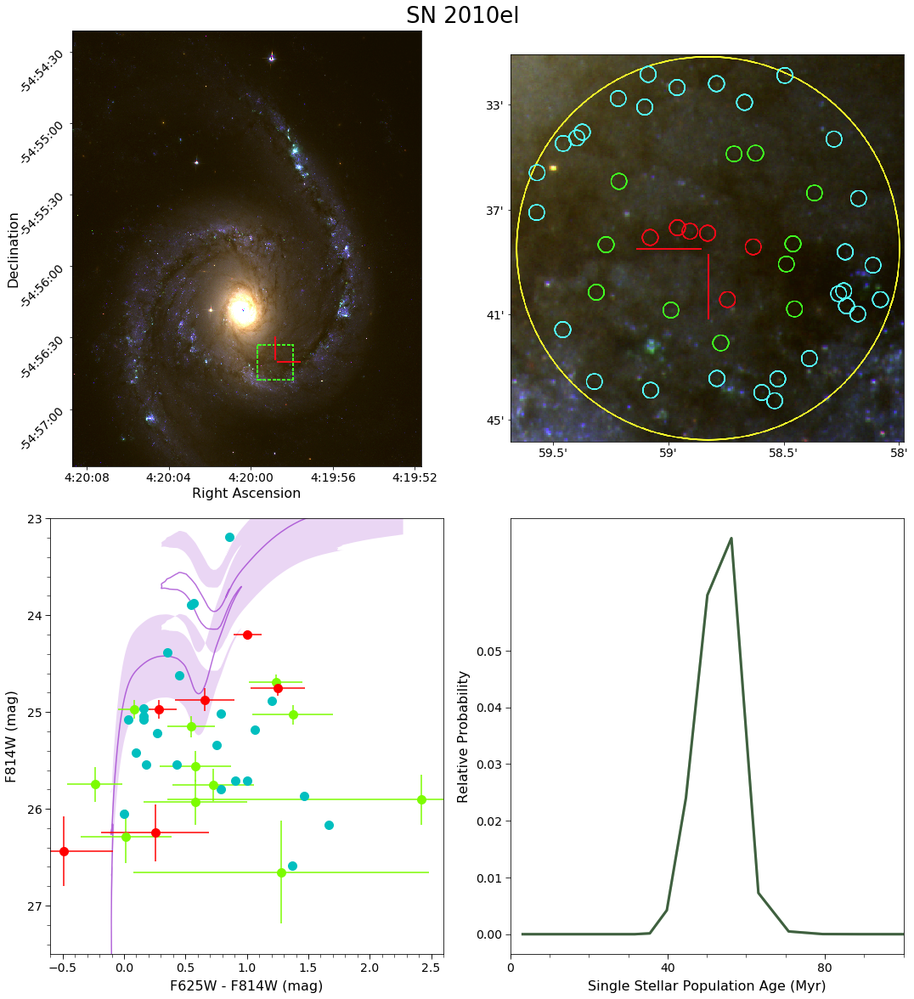

In [34]:
from matplotlib import gridspec
import matplotlib.image as im
from matplotlib.ticker import MultipleLocator

# Setup figure and grid
fig = plt.figure(figsize=(18,20))
gs = gridspec.GridSpec(2, 2)
gs.update(wspace=0.17, hspace=0.12)

axis_font = {'size':'16'} # Sets font size
tick_font = {'size':'14'}

### Figure 0: Whole galaxy ###
ax0 = plt.subplot(gs[0,0])
image=im.imread(Iax_dir + '/Iax_Pictures/2010el_4kpc.5kpc.png')
ax0.imshow(image)
# Setting the ticks
x_tick = 794/(68.679 - 51.68)
x_start = x_tick*.679
ax0.set_xticks([x_start, x_start+4*x_tick, x_start+8*x_tick, x_start+12*x_tick, x_start+16*x_tick])
ax0.set_xticklabels(['4:20:08', '4:20:04', '4:20:00', '4:19:56', '4:19:52'], **tick_font)
y_tick = 992/(203.99 - 21.21)
y_start = y_tick*8.79
ax0.set_yticks([y_start, y_start + 30*y_tick, y_start + 60*y_tick,
                y_start + 90*y_tick, y_start + 120*y_tick, y_start + 150*y_tick])
ax0.set_yticklabels(['-54:54:30', '-54:55:00', '-54:55:30', '-54:56:00', '-54:56:30', '-54:57:00'],
                    rotation=45, **tick_font)
# Setting labels
ax0.set_xlabel("Right Ascension", **axis_font)
ax0.set_ylabel("Declination", **axis_font)
ax0.xaxis.set_label_coords(.5, -.05)
#ax0.xaxis.set_ticks_position('none')
ax0.yaxis.set_label_coords(-.15, .5)
#ax0.yaxis.set_ticks_position('none')

### Figure 1: Zoom in on ROI ###
ax1 = plt.subplot(gs[0,1])
image=im.imread(Iax_dir + '/Iax_Pictures/2010el_400pc.400pc.png')
ax1.imshow(image)
# Setting the ticks
x_tick = 1008/(59.685 - 57.98)
x_start = x_tick*.185
ax1.set_xticks([x_start, x_start + .5*x_tick, x_start + x_tick, x_start + 1.5*x_tick])
ax1.set_xticklabels(["59.5'", "59'", "58.5'", "58'"], **tick_font)
y_tick = 992/(45.85 - 31.1)
y_start = y_tick*1.9
ax1.set_yticks([y_start, y_start + 4*y_tick, y_start + 8*y_tick, y_start + 12*y_tick])
ax1.set_yticklabels(["33'", "37'", "41'", "45'"], **tick_font)
# Setting labels
ax1.xaxis.set_label_coords(.5, -.18)
#ax1.xaxis.set_ticks_position('none')
ax1.yaxis.set_label_coords(-.45, .5)
#ax1.yaxis.set_ticks_position('none')

### Figure 2: Color-magnitude diagram ###
ax2 = plt.subplot(gs[1,0])
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()
ages = ages[(ages > 7.74) & (ages < 7.76)]
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    ax2.plot(color, mag, alpha=0.7, color='darkorchid', zorder=0)
    ax2.fill_between(color, mag_lower, mag_upper, facecolor='darkorchid', alpha=0.2, edgecolor='none')
# Plots stars
line1 = ax2.plot(info200[:,41] - info200[:,54], info200[:,54], 'co', markersize=10)
#line2 = ax2.plot(info133[:,41] - info133[:,54], info133[:,54], 'go')
line2 = ax2.errorbar(info133[:,41] - info133[:,54], info133[:,54], color='lawngreen', marker='o', linestyle='',
                    xerr=np.sqrt(info133[:,43]**2 + info133[:,56]**2), yerr=info133[:,56], markersize=10)
#line3 = ax2.plot(info67[:,41] - info67[:,54], info67[:,54], 'r.')
line3 = ax2.errorbar(info67[:,41] - info67[:,54], info67[:,54], fmt='ro',
                     xerr=np.sqrt(info67[:,43]**2 + info67[:,56]**2), yerr=info67[:,56], markersize=10)
# Plots reddening vector
plt.arrow(-.1, 20.2, (3.610 - 2.792)*Gal_ext, 2.792*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')
# Setting labels and axis range
ax2.set_xlabel("F625W - F814W (mag)", **axis_font)
ax2.set_ylabel("F814W (mag)", **axis_font)
ax2.xaxis.set_label_coords(.5, -.06)
ax2.yaxis.set_label_coords(-.08, .5)
ax2.set_ylim(27.5,23)
ax2.set_xlim(-.6, 2.6)
ax2.tick_params(axis='both', which='major', labelsize=14, length=6)
ax2.tick_params(axis='both', which='minor', length=4)
#ax2.set_yticks(np.arange(26, 29))
#ax2.set_xticks(np.arange(-.50,2,.5))
ax2.xaxis.set_major_locator(MultipleLocator(.5))
ax2.xaxis.set_minor_locator(MultipleLocator(.1))
ax2.yaxis.set_major_locator(MultipleLocator(1))
ax2.yaxis.set_minor_locator(MultipleLocator(.2))

### Figure 3: Probability distribution function ###
ax3 = plt.subplot(gs[1,1])
norm_linear = np.trapz(probs_tot, 10**(CChi[0, 0, :, 3, 0])/1e6)
ax3.plot(10**(CChi[0, 0, :, 3, 0])/1e6, probs_tot/norm_linear, 'g-', alpha=.5, linewidth=3)
ax3.plot(10**(CChi[0, 0, :, 3, 0])/1e6, probs_tot/norm_linear, 'k-', alpha=.5, linewidth=3)
# Setting labels and axis range
ax3.set_xlabel("Single Stellar Population Age (Myr)", **axis_font)
ax3.set_ylabel("Relative Probability", **axis_font)
ax3.xaxis.set_label_coords(.5, -.06)
ax3.yaxis.set_label_coords(-.1, .5)
ax3.set_xlim(0,100)
ax3.tick_params(axis='both', which='major', labelsize=14, length=6)
ax3.tick_params(axis='both', which='minor', length=4)
ax3.xaxis.set_major_locator(MultipleLocator(40))
ax3.xaxis.set_minor_locator(MultipleLocator(10))
ax3.set_yticks(np.arange(0, .06, .01));

plt.suptitle('SN 2010el', y=.9, size=26)

#plt.savefig('2010el_Fig.pdf', dpi=1000)

## False Star Tests

In [22]:
x_pos = 2280 + 300*np.random.rand(50)
y_pos = 1380 + 300*np.random.rand(50)

f435w_mags = 17 + 12*np.random.rand(1000) # Range of 17 to 29 in mag
Iax_dir = "/Users/tktakaro/Documents/Type-Iax-HST"
file = open(Iax_dir + "/new_files/sn2010el/fake_stars.list", "w+")
for j in range(x_pos.size):
    for i in range(f435w_mags.size):
        file.write('0 1 {x} {y} {f4} {f4} {f4} {f4}\n'.format(x=x_pos[j], y=y_pos[j], f4=f435w_mags[i]))
file.close()

In [97]:
# Loading in the false star test
catalog_false_f435w = np.loadtxt(Iax_dir + "/new_files/sn2010el/sn2010el_f435w.fake")
catalog_false_f555w = np.loadtxt(Iax_dir + "/new_files/sn2010el/sn2010el_f555w.fake")
catalog_false_f625w = np.loadtxt(Iax_dir + "/new_files/sn2010el/sn2010el_f625w.fake")
catalog_false_f814w = np.loadtxt(Iax_dir + "/new_files/sn2010el/sn2010el_f814w.fake")

In [98]:
recovered_mags = np.zeros([50000,23]) # 1. X position, 2. Y position, 3. Inserted Mag, 4. Recovered mag (f435w),
# 5. S/N (f435w), 6. Sharpness (f435w), 7. Roundness (f435w), 8. Crowding (f435w), 9.+ same, for other filters
for i in range(catalog_false_f435w.shape[0]):
    # X, Y, and Inserted Magnitude
    recovered_mags[i,0] = catalog_false_f435w[i,2]
    recovered_mags[i,1] = catalog_false_f435w[i,3]
    recovered_mags[i,2] = catalog_false_f435w[i,5]
    # Recovered mag in F435W
    if (catalog_false_f435w[i,14] == 0) and (catalog_false_f435w[i,15] == 0):
        recovered_mags[i,3] = 99.999
    else:
        recovered_mags[i,3] = catalog_false_f435w[i,27]
        recovered_mags[i,4:8] = catalog_false_f435w[i,17:21]
    # Recovered mag in F555W
    if (catalog_false_f555w[i,14] == 0) and (catalog_false_f555w[i,15] == 0):
        recovered_mags[i,8] = 99.999
    else:
        recovered_mags[i,8] = catalog_false_f555w[i,27]
        recovered_mags[i,9:13] = catalog_false_f555w[i,17:21]
    # Recovered mag in F625W
    if (catalog_false_f625w[i,14] == 0) and (catalog_false_f625w[i,15] == 0):
        recovered_mags[i,13] = 99.999
    else:
        recovered_mags[i,13] = catalog_false_f625w[i,27]
        recovered_mags[i,14:18] = catalog_false_f625w[i,17:21]
    # Recovered mag in F814W
    if (catalog_false_f814w[i,14] == 0) and (catalog_false_f814w[i,15] == 0):
        recovered_mags[i,18] = 99.999
    else:
        recovered_mags[i,18] = catalog_false_f814w[i,27]
        recovered_mags[i,19:23] = catalog_false_f814w[i,17:21]

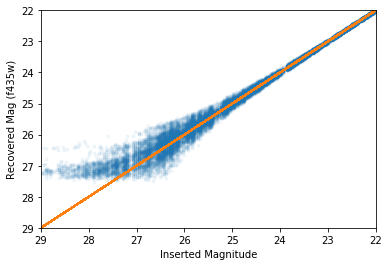

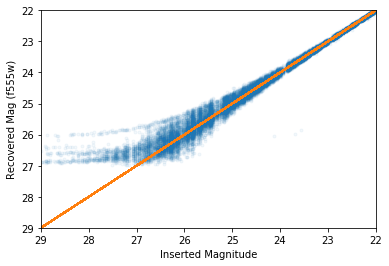

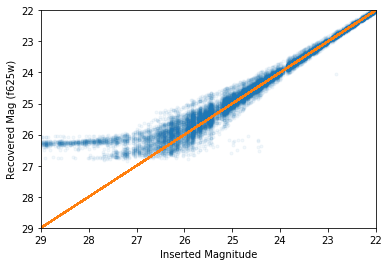

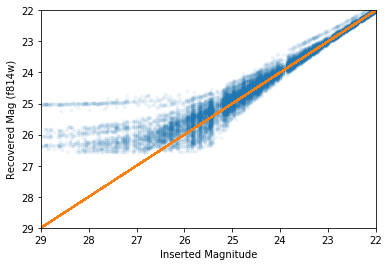

In [99]:
plt.plot(recovered_mags[:,2], recovered_mags[:,3], '.', alpha=.05)
plt.plot(recovered_mags[:,2], recovered_mags[:,2], '--')
plt.ylim(29,22)
plt.xlim(29,22)
plt.xlabel("Inserted Magnitude")
plt.ylabel("Recovered Mag (f435w)")
plt.show()

plt.plot(recovered_mags[:,2], recovered_mags[:,8], '.', alpha=.05)
plt.plot(recovered_mags[:,2], recovered_mags[:,2], '--')
plt.ylim(29,22)
plt.xlim(29,22)
plt.xlabel("Inserted Magnitude")
plt.ylabel("Recovered Mag (f555w)")
plt.show()

plt.plot(recovered_mags[:,2], recovered_mags[:,13], '.', alpha=.05)
plt.plot(recovered_mags[:,2], recovered_mags[:,2], '--')
plt.ylim(29,22)
plt.xlim(29,22)
plt.xlabel("Inserted Magnitude")
plt.ylabel("Recovered Mag (f625w)")
plt.show()

plt.plot(recovered_mags[:,2], recovered_mags[:,18], '.', alpha=.05)
plt.plot(recovered_mags[:,2], recovered_mags[:,2], '--')
plt.ylim(29,22)
plt.xlim(29,22)
plt.xlabel("Inserted Magnitude")
plt.ylabel("Recovered Mag (f814w)")
plt.show()

In [100]:
f435w_mags = []
f435w_recover = []
f555w_mags = []
f555w_recover = []
f625w_mags = []
f625w_recover = []
f814w_mags = []
f814w_recover = []
# Calculate recovery percentage as a function of inserted mag
for i in range(catalog_false_f435w.shape[0]):
    f435w_mags.append(recovered_mags[i,2])
    f555w_mags.append(recovered_mags[i,2])
    f625w_mags.append(recovered_mags[i,2])
    f814w_mags.append(recovered_mags[i,2])
    if abs(recovered_mags[i,2] - recovered_mags[i,3]) < .5:
        f435w_recover.append(recovered_mags[i,2])
    if abs(recovered_mags[i,2] - recovered_mags[i,8]) < .5:
        f555w_recover.append(recovered_mags[i,2])
    if abs(recovered_mags[i,2] - recovered_mags[i,13]) < .5:
        f625w_recover.append(recovered_mags[i,2])
    if abs(recovered_mags[i,2] - recovered_mags[i,18]) < .5:
        f814w_recover.append(recovered_mags[i,2])

In [101]:
# Setting up the histogram bins w/ .1 mag resolution
b = []
for i in range(121):
    b.append(17 + i/10.)

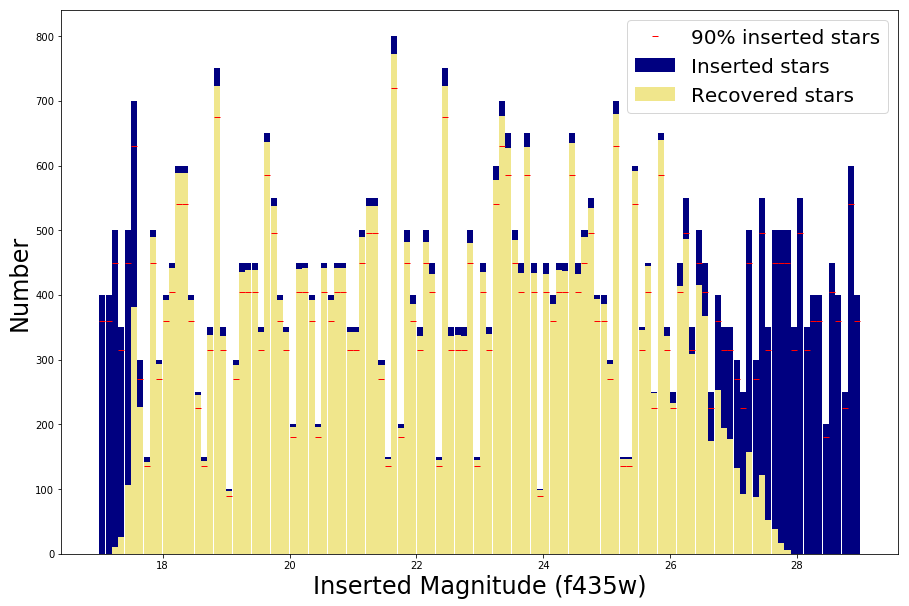

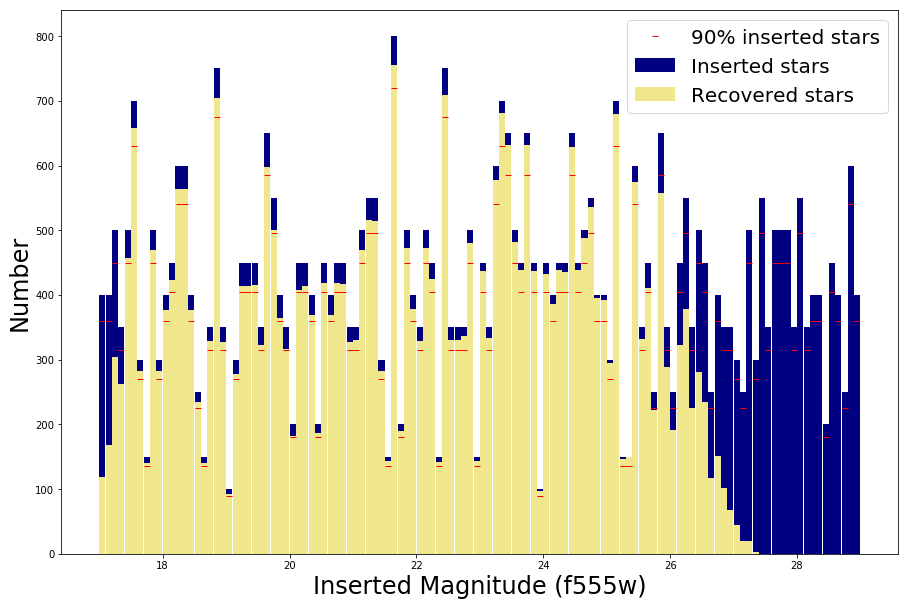

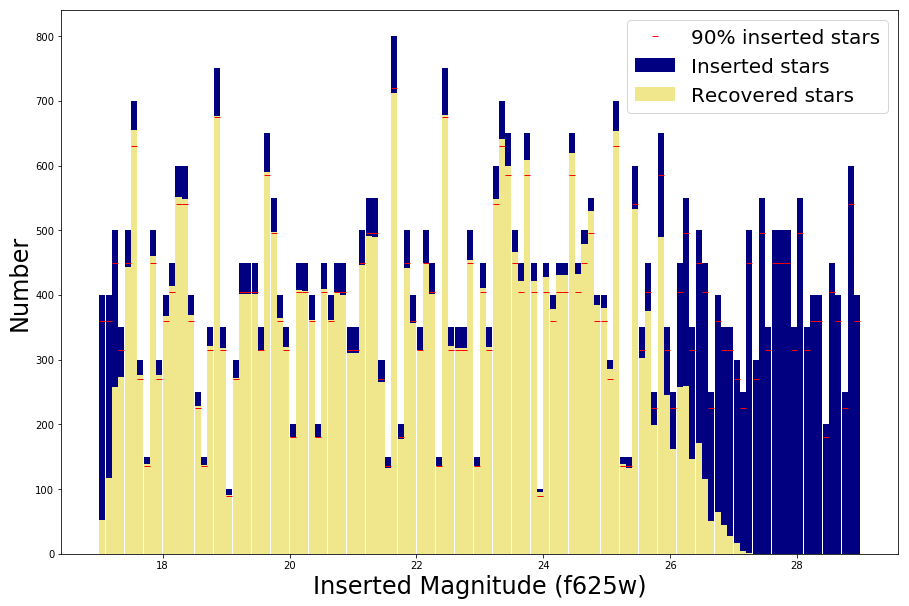

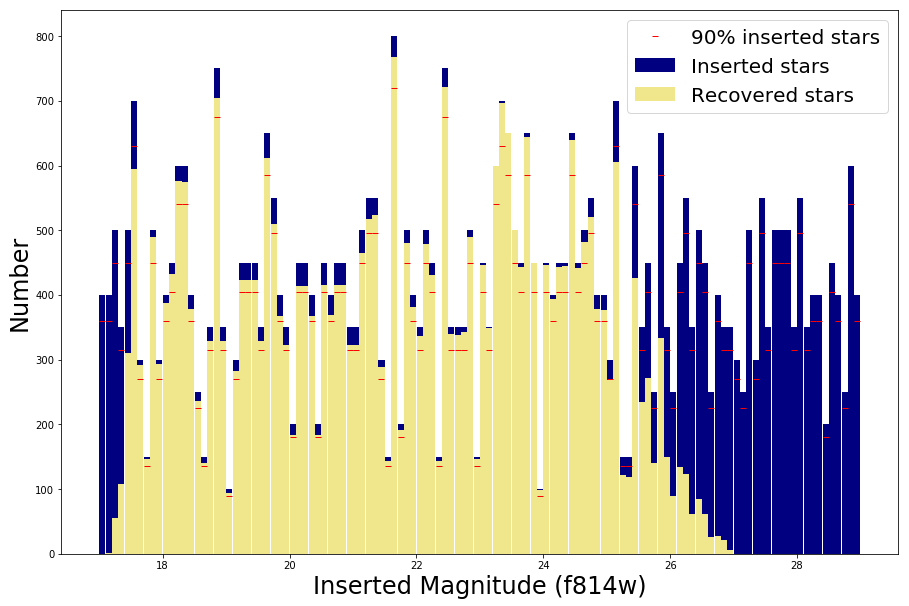

In [102]:
plt.subplots(figsize=(15, 10))
#b = [17,17.5,18,18.5,19,19.5,20,20.5,21,21.5,22,22.5,23,23.5,24,24.5,25,25.5,26,26.5,27,27.5,28,28.5,29,29.5,30]
h4 = plt.hist(f435w_mags, bins=b, facecolor='navy', rwidth=.95, label='Inserted stars')
r4 = plt.hist(f435w_recover, bins=b, rwidth=.95, facecolor='khaki', label='Recovered stars')
plt.plot(h4[1][:-1]+.05, .9*h4[0], 'r_', markersize=6, label='90% inserted stars')
plt.xlabel("Inserted Magnitude (f435w)", fontsize=24)
plt.ylabel("Number", fontsize=24)
plt.legend(fontsize=20)
plt.show()

plt.subplots(figsize=(15, 10))
h5 = plt.hist(f555w_mags, bins=b, facecolor='navy', rwidth=.95, label='Inserted stars')
r5 = plt.hist(f555w_recover, bins=b, rwidth=.95, facecolor='khaki', label='Recovered stars')
plt.plot(h5[1][:-1]+.05, .9*h5[0], 'r_', markersize=6, label='90% inserted stars')
plt.xlabel("Inserted Magnitude (f555w)", fontsize=24)
plt.ylabel("Number", fontsize=24)
plt.legend(fontsize=20)
plt.show()

plt.subplots(figsize=(15, 10))
h6 = plt.hist(f625w_mags, bins=b, facecolor='navy', rwidth=.95, label='Inserted stars')
r6 = plt.hist(f625w_recover, bins=b, rwidth=.95, facecolor='khaki', label='Recovered stars')
plt.plot(h6[1][:-1]+.05, .9*h6[0], 'r_', markersize=6, label='90% inserted stars')
plt.xlabel("Inserted Magnitude (f625w)", fontsize=24)
plt.ylabel("Number", fontsize=24)
plt.legend(fontsize=20)
plt.show()

plt.subplots(figsize=(15, 10))
h8 = plt.hist(f814w_mags, bins=b, facecolor='navy', rwidth=.95, label='Inserted stars')
r8 = plt.hist(f814w_recover, bins=b, rwidth=.95, facecolor='khaki', label='Recovered stars')
plt.plot(h8[1][:-1]+.05, .9*h8[0], 'r_', markersize=6, label='90% inserted stars')
plt.xlabel("Inserted Magnitude (f814w)", fontsize=24)
plt.ylabel("Number", fontsize=24)
plt.legend(fontsize=20)
plt.show()

frac_f435w = r4[0]/h4[0]
frac_f555w = r5[0]/h5[0]
frac_f625w = r6[0]/h6[0]
frac_f814w = r8[0]/h8[0]

26.25
20.15
20.05
25.05


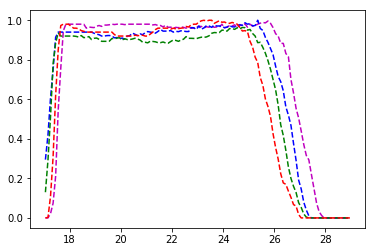

In [103]:
from scipy.interpolate import interp1d

plt.plot(h4[1][:-1]+.05, frac_f435w, 'm--')
plt.plot(h5[1][:-1]+.05, frac_f555w, 'b--')
plt.plot(h6[1][:-1]+.05, frac_f625w, 'g--')
plt.plot(h8[1][:-1]+.05, frac_f814w, 'r--')

print(h4[1][:-1][np.argmin(abs(frac_f435w - .9))] + .05)
print(h5[1][:-1][np.argmin(abs(frac_f555w - .9))] + .05)
print(h6[1][:-1][np.argmin(abs(frac_f625w - .9))] + .05)
print(h8[1][:-1][np.argmin(abs(frac_f814w - .9))] + .05)

In [104]:
# Save recovery fractions and associated magnitudes in two numpy arrays
frac_array = np.array([frac_f435w, frac_f555w, frac_f625w, frac_f814w])
bin_array = np.array([h4[1], h5[1], h6[1], h8[1]])
np.save('10el_frac.npy', frac_array)
np.save('10el_bins.npy', bin_array)

## WFC3 Analysis

In [25]:
catalog_WFC3 = np.loadtxt(Iax_dir+"/new_files/sn2010el/sn2010el_WFC3_OLD")

In [26]:
pos_predict_WFC3 = np.zeros((catalog_WFC3.shape[0],2))
info_predict_WFC3 = np.zeros(np.shape(catalog_WFC3))

j = 0 # Iteration variable for positions array
for i in range(catalog_WFC3.shape[0]): # Cycles through each object in catalog
    # Checks to make sure point is "good"
    # Good defined by: 1. S/N > 3.5     2. Sharpness < .3     3. Roundness < 1     4. Crowding < .1 
    if ((catalog_WFC3[i][5] >= 3.5)&(abs(catalog_WFC3[i][6]) < .3)&(abs(catalog_WFC3[i][7]) < 1)
        &(catalog_WFC3[i][9] < .1)):
        pos_predict_WFC3[j][0] = catalog_WFC3[i][2] # Assigns X position
        pos_predict_WFC3[j][1] = catalog_WFC3[i][3] # Assigns Y position
        info_predict_WFC3[j] = catalog_WFC3[i]
        j = j + 1
                
# Trims all zeros from end of positions array, left from "bad" objects
pos_predict_WFC3 = pos_predict_WFC3[~np.all(pos_predict_WFC3 == 0, axis=1)]
info_predict_WFC3 = info_predict_WFC3[~np.all(info_predict_WFC3 == 0, axis=1)]

# Saves high S/N object X,Y positions
np.savetxt("Region_files/sn2010el_Prediction_WFC3.reg", pos_predict_WFC3, '%5.2f')

In [27]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2010el_200pc_WFC3.reg", "r+")

def mysplit(s, delim=None):
    return [x for x in s.split(delim) if x]

text = asci.readlines()
region = np.zeros([193,2])
for i in range(193):
    region[i][0] = mysplit(text[i], ' ')[0]
    region[i][1] = mysplit(text[i], ' ')[1]
region = region[~np.all(region == 0, axis=1)]

# Info for each star chosen as real 
info_WFC3 = np.zeros([region.shape[0],info_predict_WFC3.shape[1]])

j = 0 # Iteration variable for region array
for i in range(info_predict_WFC3.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == pos_predict_WFC3[i][0])&(region[j][1] == pos_predict_WFC3[i][1]):
        info_WFC3[j] = info_predict_WFC3[i]
        j = j + 1
        if j == region.shape[0]: break

In [28]:
# Using IRAF to compute actual concentration index, i.e. photometry at .5 pixels to photometry at 3 pixels
ascii_1 = open(Iax_dir + "/new_files/sn2010el/final_WFC3_F555W_crc.fits1.mag.1")
ascii_2 = open(Iax_dir + "/new_files/sn2010el/final_WFC3_F555W_crc.fits1.mag.2")
text_1 = ascii_1.readlines()
text_2 = ascii_2.readlines()

concentration = np.zeros(193)
for i in range(193):
    if mysplit(text_1[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at .5 pixels
        concentration[i] = 99
    elif mysplit(text_2[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at 3 pixels
        concentration[i] = -99
    else: concentration[i] = float(mysplit(text_1[5*i + 79])[4]) - float(mysplit(text_2[5*i + 79])[4])
ascii_1.close()
ascii_2.close()

(0, -10)

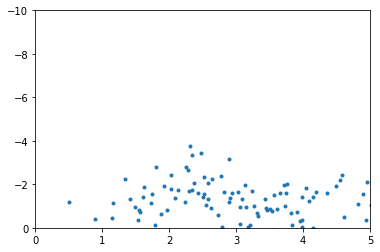

In [29]:
plt.plot(concentration, info_WFC3[:,41] - 5*(np.log10(5.63e6) - 1), '.')
plt.xlim(0,5)
plt.ylim(0,-10)

In [30]:
# Cut out clusters (identified as objects with concentration parameter < 2.3, from Chandar et. al. 2010)
info_temp = info_WFC3[:,:]
info_WFC3 = np.zeros(info_temp.shape)
for i in range(193):
    if (concentration[i] < 2.3): #not ((concentration[i] > 2.5) and (info_new[i,41] - 5*(np.log10(5.63e6) - 1) < -5)):
        info_WFC3[i] = info_temp[i]
info_WFC3 = info_WFC3[~np.all(info_WFC3 == 0, axis=1)]

np.savetxt("Region_files/sn2010el_NoClustersROI_WFC3.reg", info_WFC3[:,2:4], '%5.2f')

In [31]:
print(info_WFC3.shape)

(63, 739)


In [32]:
mist_dir = "/Users/tktakaro/Documents/Type-Iax-HST/MIST/WFC3-UVIS"

kwargs = {"names": ["EEP", "log10_isochrone_age_yr", "initial_mass", "star_mass", "log_Teff", "log_g", "log_L",
                        "[Fe/H]_init", "[Fe/H]", "WFC3_UVIS_F200LP", "WFC3_UVIS_F218W", "WFC3_UVIS_F225W",
                        "WFC3_UVIS_F275W", "WFC3_UVIS_F280N", "WFC3_UVIS_F300X", "WFC3_UVIS_F336W",
                        "WFC3_UVIS_F343N", "WFC3_UVIS_F350LP", "WFC3_UVIS_F373N", "WFC3_UVIS_F390M",
                        "WFC3_UVIS_F390W", "WFC3_UVIS_F395N", "WFC3_UVIS_F410M", "WFC3_UVIS_F438W",
                        "WFC3_UVIS_F467M", "WFC3_UVIS_F469N", "WFC3_UVIS_F475W", "WFC3_UVIS_F475X",
                        "WFC3_UVIS_F487N", "WFC3_UVIS_F502N", "WFC3_UVIS_F547M", "WFC3_UVIS_F555W",
                        "WFC3_UVIS_F600LP", "WFC3_UVIS_F606W", "WFC3_UVIS_F621M", "WFC3_UVIS_F625W",
                        "WFC3_UVIS_F631N", "WFC3_UVIS_F645N", "WFC3_UVIS_F656N", "WFC3_UVIS_F657N",
                        "WFC3_UVIS_F658N", "WFC3_UVIS_F665N", "WFC3_UVIS_F673N", "WFC3_UVIS_F680N",
                        "WFC3_UVIS_F689M", "WFC3_UVIS_F763M", "WFC3_UVIS_F775W", "WFC3_UVIS_F814W",
                        "WFC3_UVIS_F845M", "WFC3_UVIS_F850LP", "WFC3_UVIS_F953N", "WFC3_IR_F098M",
                        "WFC3_IR_F105W", "WFC3_IR_F110W", "WFC3_IR_F125W", "WFC3_IR_F126N", "WFC3_IR_F127M",
                        "WFC3_IR_F128N", "WFC3_IR_F130N", "WFC3_IR_F132N", "WFC3_IR_F139M", "WFC3_IR_F140W",
                        "WFC3_IR_F153M", "WFC3_IR_F160W", "WFC3_IR_F164N", "WFC3_IR_F167N", "phase"],
            "delim_whitespace": True, "comment": "#"}
isochrones = {}
for filename in glob.glob(mist_dir + "/*.iso.cmd"):
    filename = filename.replace("\\", "/")
    feh_string = filename.split("/")[-1].split("=")[1].split(".iso")[0] # Pulls metalicity information
    feh = float(feh_string) # feh is [Fe/H]
    df = pandas.read_csv(filename, **kwargs)
    df['ages'] = 10 ** df.log10_isochrone_age_yr / 1e9
    isochrones[feh] = df # Creates dictionary accessible by entering a particular metalicity

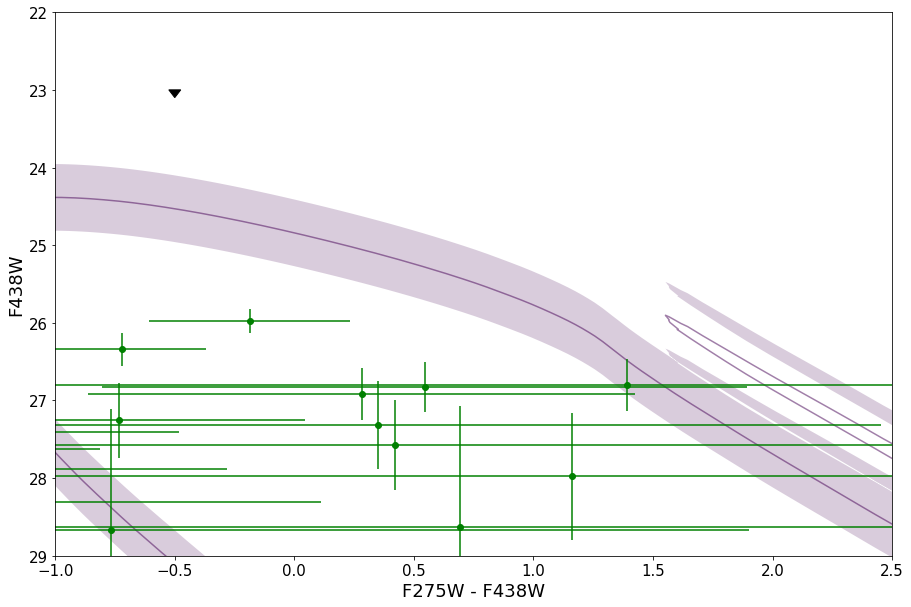

In [33]:
# fix metallicity, vary age
df = isochrones[.01] # FIX THIS
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 7.74) & (ages < 7.76)]
#ages = ages[(ages > 8.34) & (ages < 8.36)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(5.63e6) - 1)
    F275W_ext = 0.050 # extinction in F435W in NGC 1566 from NED
    F438W_ext = 0.033 # extinction in F555W in NGC 1566 from NED
    Gal_ext = 0
    # Multiply Gal_ext by A_lambda/E(B-V) values from Schlafly, Finkbeiner 2011
    mag = df[idx].WFC3_UVIS_F275W + dist_adjust + F275W_ext + 5.487*Gal_ext
    color = df[idx].WFC3_UVIS_F275W - df[idx].WFC3_UVIS_F438W  + F275W_ext - F438W_ext + (5.487 - 3.623) * Gal_ext
    
    mag_lower = df[idx].WFC3_UVIS_F275W + dist_lower + F275W_ext + 5.487*red_lower
    mag_upper = df[idx].WFC3_UVIS_F275W + dist_upper + F275W_ext + 5.487*red_upper
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
line1 = plt.errorbar(info_WFC3[:,15] - info_WFC3[:,41], info_WFC3[:,41], fmt='go', 
                     xerr=np.sqrt(info_WFC3[:,17]**2 + info_WFC3[:,43]**2), yerr=info_WFC3[:,43])

# Plots reddening vector
plt.arrow(-0.5, 23, (3.610 - 2.792)*Gal_ext, 2.792*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')

plt.xlabel("F275W - F438W", fontsize=18)
plt.ylabel("F438W", fontsize=18)
plt.ylim(29,22)
plt.xlim(-1, 2.5)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.draw()
plt.show()

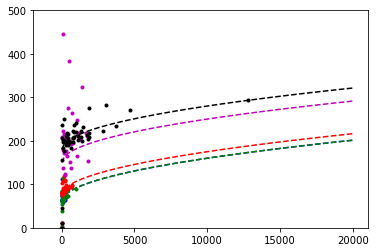

In [34]:
# Testing to find relationship between flux and flux error
x_array=np.linspace(0, 20000, num=100)

plt.plot(info_WFC3[:,11], info_WFC3[:,17]/1.0857 * info_WFC3[:,11], 'b.')
plt.plot(x_array, 60 + np.sqrt(x_array), 'b--')
plt.plot(info_WFC3[:,24], info_WFC3[:,30]/1.0857 * info_WFC3[:,24], 'g.')
plt.plot(x_array, 60 + np.sqrt(x_array), 'g--')
plt.plot(info_WFC3[:,37], info_WFC3[:,43]/1.0857 * info_WFC3[:,37], 'r.')
plt.plot(x_array, 75 + np.sqrt(x_array), 'r--')
plt.plot(info_WFC3[:,50], info_WFC3[:,56]/1.0857 * info_WFC3[:,50], 'm.')
plt.plot(x_array, 150 + np.sqrt(x_array), 'm--')
plt.plot(info_WFC3[:,63], info_WFC3[:,69]/1.0857 * info_WFC3[:,63], 'k.')
plt.plot(x_array, 180 + np.sqrt(x_array), 'k--')
plt.ylim(0,500)
plt.show()

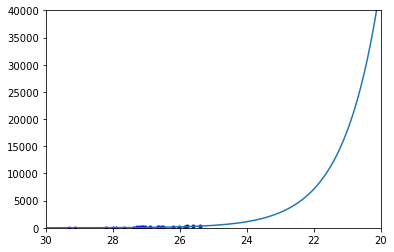

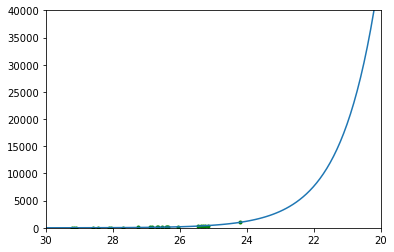

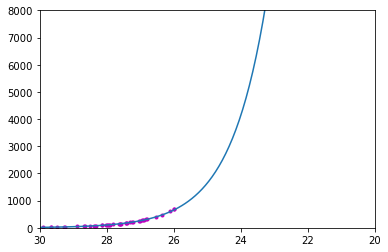

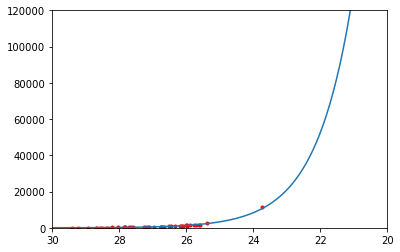

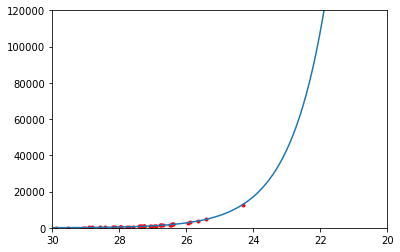

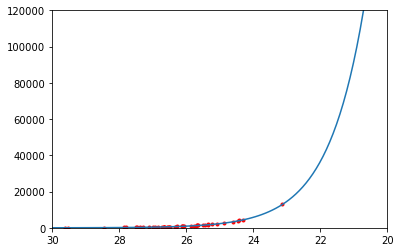

In [35]:
x_array = np.linspace(20,30,100)
plt.ylim(0,40000)
plt.xlim(30,20)
plt.plot(info_WFC3[:,15], info_WFC3[:,11], 'b.')
plt.plot(x_array, 1.7*2382 * 10**((22.615 - x_array)/2.5))
plt.show()

plt.ylim(0,40000)
plt.xlim(30,20)
plt.plot(info_WFC3[:,28], info_WFC3[:,24], 'g.')
plt.plot(x_array, 1.7*1119 * 10**((23.513 - x_array)/2.5))
plt.show()

plt.ylim(0,8000)
plt.xlim(30,20)
plt.plot(info_WFC3[:,41], info_WFC3[:,37], 'm.')
plt.plot(x_array, 1.7*965 * 10**((24.997 - x_array)/2.5))
plt.show()

plt.ylim(0,120000)
plt.xlim(30,20)
plt.plot(info_WFC3[:,54], info_WFC3[:,50], 'r.')
plt.plot(x_array, 1.7*2420 * 10**((24.765 - x_array)/2.5))
plt.show()

plt.ylim(0,120000)
plt.xlim(30,20)
plt.plot(info_WFC3[:,67], info_WFC3[:,63], 'r.')
plt.plot(x_array, 1.7*1853 * 10**((25.841 - x_array)/2.5))
plt.show()

plt.ylim(0,120000)
plt.xlim(30,20)
plt.plot(info_WFC3[:,80], info_WFC3[:,76], 'r.')
plt.plot(x_array, 1.7*1769 * 10**((24.712 - x_array)/2.5))
plt.show()

In [50]:
metallicity = np.array([.02, .09, .16, .23, .30])
reddening = np.array([0, .10254, .20507])
SN_pos = np.array([2781.5582, 2209.701]) #([1777.1903, 1896.8087])
CChi = np.zeros([metallicity.size, reddening.size, 41, 4, 1]) #41 = n_ages

F275W_ext = 0.050
F336W_ext = 0.040
F438W_ext = 0.033
F555W_ext = 0.026
F814W_ext = 0.014

for k, met in enumerate(metallicity):
    df = isochrones[met] # Sets metallicity. Eventually this will be varied over.
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        for i, age in enumerate(ages):
            CChi[k, j, i, 1, :] = met
            CChi[k, j, i, 2, :] = red
            CChi[k, j, i, 3, :] = age
            
            idx = df.log10_isochrone_age_yr == age
            mag_275 = df[idx].WFC3_UVIS_F275W + dist_adjust + F275W_ext + 5.487*red 
            mag_336 = df[idx].WFC3_UVIS_F336W + dist_adjust + F336W_ext + 4.453*red
            mag_438 = df[idx].WFC3_UVIS_F438W + dist_adjust + F438W_ext + 3.623*red
            mag_555 = df[idx].WFC3_UVIS_F555W + dist_adjust + F555W_ext + 2.855*red
            mag_814 = df[idx].WFC3_UVIS_F814W + dist_adjust + F814W_ext + 1.536*red
            
            
            phys_dist_temp = 0 # This will hold the total physical distance weights to be averaged and divided out to normalize
            temp = 0 # This will hold the distance for each data point to the line
    
            # Sets the radial dispersion for the region
            sigma = 5 * (.92 * 10**age * 3.15e7 * 206265)/(5.63e6 * 3.086e13 * .05) # Replace 10**age w/ 10000000
            flat = (100 * 206265)/(5.63e6 * .05) # 100 parsecs in pixels
            flat_int = int(np.round(flat*5))
            for l in range(info_WFC3.shape[0]):
                # Removes "stars" with mag > 90 in any band
                if ((info_WFC3[l,41] > 90) or (info_WFC3[l,67] > 90) or (info_WFC3[l,80] > 90)):
                    continue
        
                # Uses physical distance between star and SN position to weight each star
                phys_dist = np.sqrt((SN_pos[0] - info_WFC3[l,2])**2 + (SN_pos[1] - info_WFC3[l,3])**2)
                weight_func = np.convolve(1/(np.sqrt(2 * np.pi) * sigma) * np.exp(- np.linspace(-200,200,2000)**2/(2 * sigma**2)),
                   np.append(np.zeros(int(np.ceil((2000-flat_int)/2))),np.append(np.ones(flat_int),np.zeros(int(np.floor((2000-flat_int)/2))))))
                phys_dist_weight = weight_func[1999 + int(phys_dist*5)]
                phys_dist_temp += phys_dist_weight # Will be used to compute average of the weights
        
                # Adds the difference in mags for each data point in quadrature.
                temp += (phys_dist_weight * np.amin(np.sqrt((info_WFC3[l,41] - mag_438)**2
                  + (info_WFC3[l,67] - mag_555)**2 + (info_WFC3[l,80] - mag_814)**2)))**2
    
            # There are 39 stars not counted, as they have >90 mag in some filter
            phys_dist_temp /= (info_WFC3.shape[0] - 34)
            CChi[k,j,i,0,:] = np.sqrt(temp)/phys_dist_temp

In [52]:
print(info_WFC3.shape[0] - 34)

29


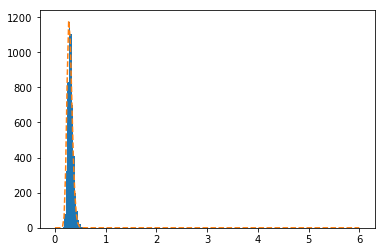

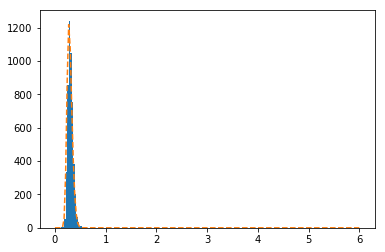

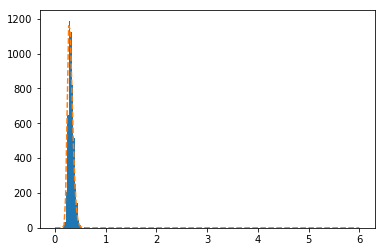

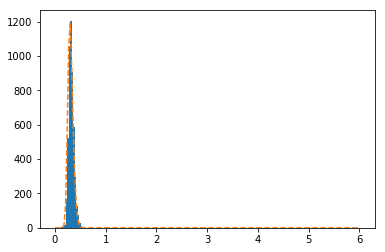

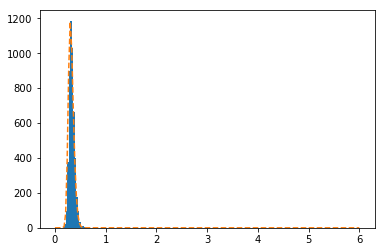

...

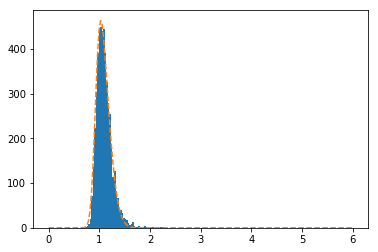

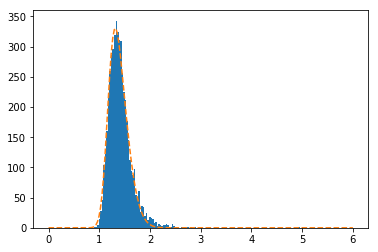

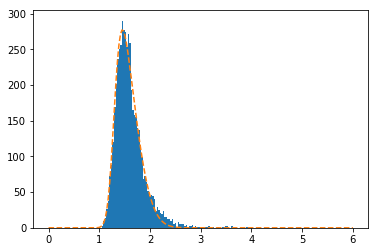

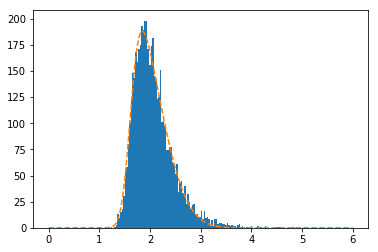

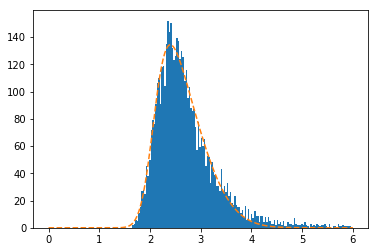

0.09 0.20507 6.5


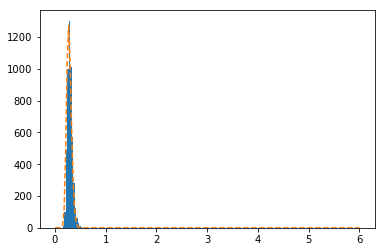

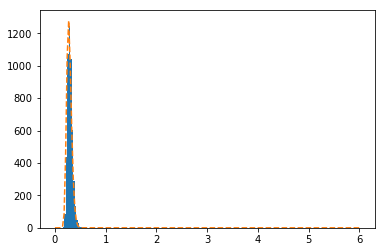

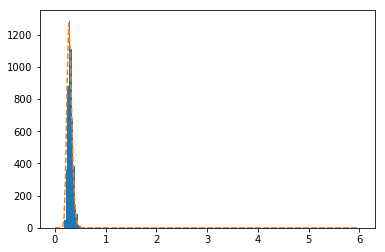

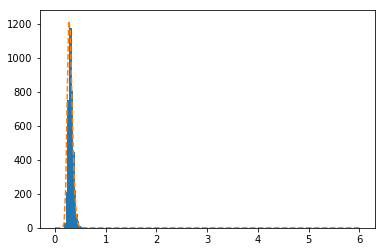

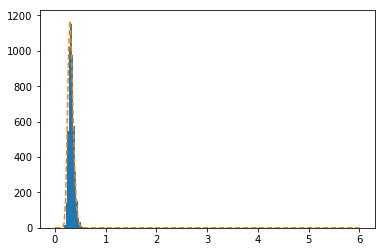

...

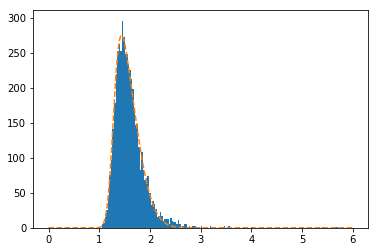

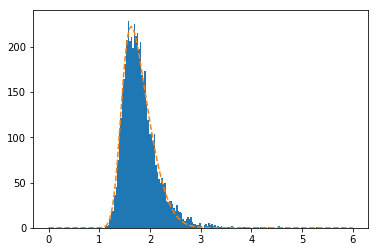

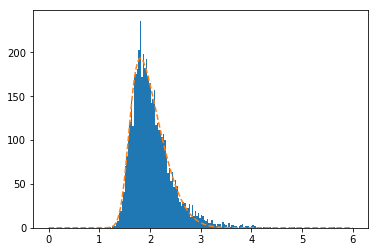

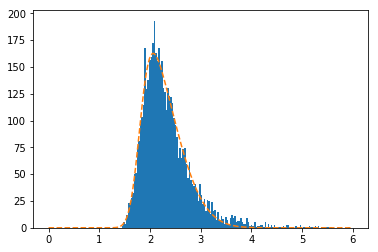

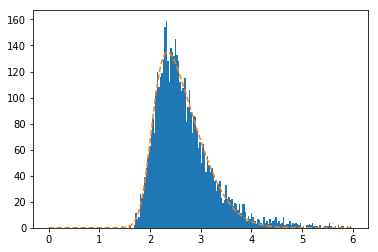

0.23 0.20507 6.5


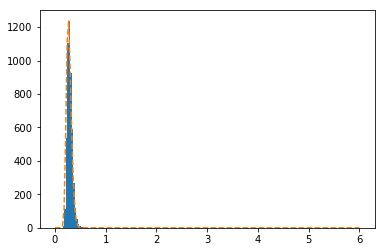

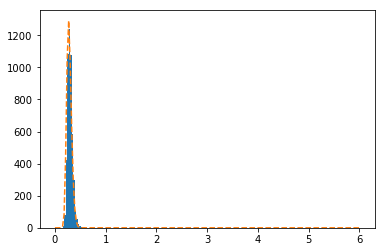

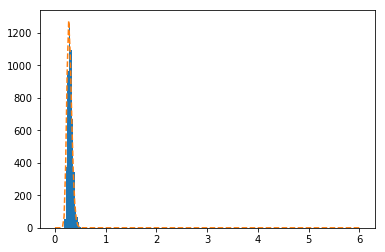

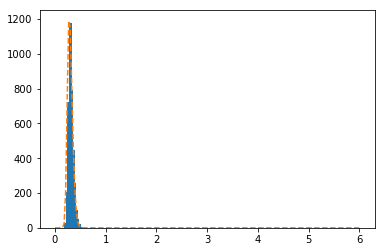

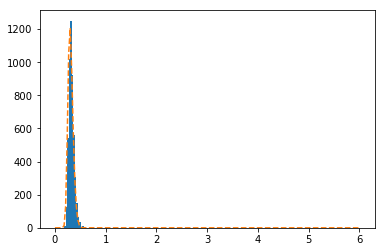

...

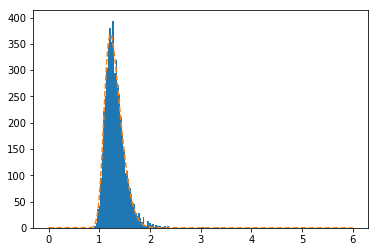

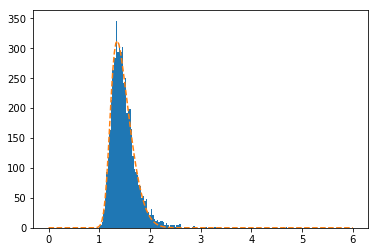

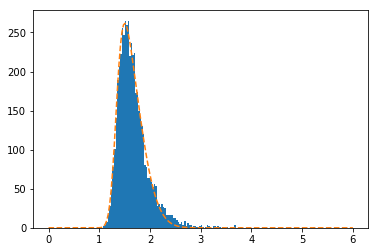

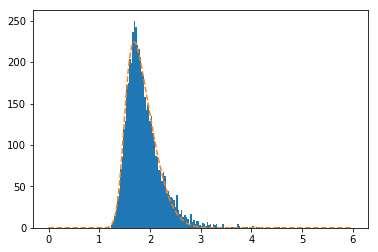

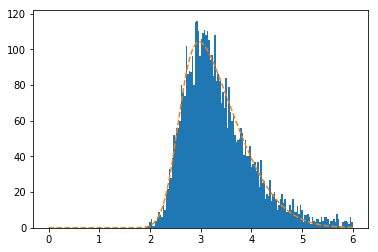

In [41]:
x = np.linspace(0,6,200)
probs = np.zeros([metallicity.size, reddening.size, 41]) #[]

CChi_false = np.load("MC_10el_MagFit_WFC3/CChi_false_ages.npy")
for k, met in enumerate(metallicity):
    df = isochrones[met]
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        popt = (2000,3,2,2)
        for i, age in enumerate(ages):
            halt = False
            for l in range(5000):
                if np.isinf(CChi_false[k,j,i,0,l]) or np.isnan(CChi_false[k,j,i,0,l]):
                    CChi_false[k,j,i,0,l] = 999999999999
                    halt = True
                    probs[k,j,i] = 0
                    break
            if halt == True:
                probs[k,j,i] = 0
                continue
            y = plt.hist(3./31. * CChi_false[k,j,i,0,:], bins=np.linspace(0,6,201))[0]
            try:
                popt, pcov = curve_fit(skew, x, y, p0=popt)
            except RuntimeError:
                print(met, red, age)
                popt = [.1 * p for p in popt]
                popt, pcov = curve_fit(skew, x, y, p0=popt)
            plt.plot(x, skew(x, *popt), '--')
            plt.show()
            norm = integrate.quad(skew, 0, 6, args=(popt[0], popt[1], popt[2], popt[3]))[0]
            probs[k,j,i] = skew(CChi[k,j,i,0,0], *popt)/norm

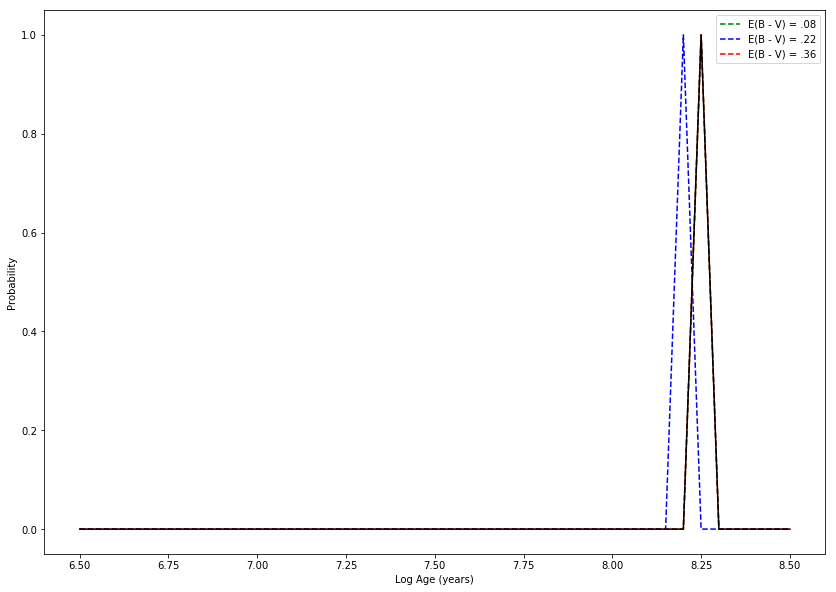

8.25


In [42]:
# Plotting different reddening values, marginalizing over metallicity prior
plt.figure(figsize=(14,10));

# Applying a gaussian prior
mu = 0.16
sigma = .07
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_red0 = (probs[0,0,:] * norm(.02) + probs[1,0,:] * norm(.09) + probs[2,0,:] * norm(.16) + 
            probs[3,0,:] * norm(.23) + probs[4,0,:] * norm(.30))/(
            norm(.02) + norm(.09) + norm(.16) + norm(.23) + norm(.30))
probs_red1 = (probs[0,1,:] * norm(.02) + probs[1,1,:] * norm(.09) + probs[2,1,:] * norm(.16) + 
            probs[3,1,:] * norm(.23) + probs[4,1,:] * norm(.30))/(
            norm(.02) + norm(.09) + norm(.16) + norm(.23) + norm(.30))
probs_red2 = (probs[0,2,:] * norm(.02) + probs[1,2,:] * norm(.09) + probs[2,2,:] * norm(.16) + 
            probs[3,2,:] * norm(.23) + probs[4,2,:] * norm(.30))/(
            norm(.02) + norm(.09) + norm(.16) + norm(.23) + norm(.30))

plt.plot(CChi[0,1,:,3,0], probs_red0/np.sum(probs_red0), 'g--', label='E(B - V) = .08')
plt.plot(CChi[0,1,:,3,0], probs_red1/np.sum(probs_red1), 'b--', label='E(B - V) = .22')
plt.plot(CChi[0,1,:,3,0], probs_red2/np.sum(probs_red2), 'r--', label='E(B - V) = .36')

mu = 0
sigma = .10254
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_tot = (probs_red0 * norm(0) + probs_red1 * norm(.10254) + 
            probs_red2 * norm(.20507))
plt.plot(CChi[0,1,:,3,0], probs_tot/np.sum(probs_tot), 'k')

plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.legend()
plt.show()

print(CChi[0,1,:,3,0][np.argmax(probs_tot)])
#np.save("Region_files/10el_Mag_probs_clusters", probs_tot)

In [95]:
print(info_WFC3.shape[0] - 39)

31


In [113]:
# Save recovery fractions and associated magnitudes in two numpy arrays
bin_array = np.array([h4[1], h5[1], h6[1], h8[1], h8[1]])
frac_array = np.array([np.ones(120), np.ones(120), np.ones(120), np.ones(120), np.ones(120)])

np.save('10el_WFC3_frac.npy', frac_array)
np.save('10el_WFC3_bins.npy', bin_array)